## Importing the libraries ##

In [1]:
%matplotlib inline
import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt

import seaborn as sns

from collections import defaultdict
from scipy.stats.stats import pearsonr


## Loading Dataframes ##


In [2]:
#read the csv files that we created for tennis player profile
df_player_profile = pd.read_csv('./tennis_profile.csv', sep = ',', index_col = 0)
df_player_profile_corr = pd.read_csv('./tennis_profile_corr.csv', sep = ',', index_col = 0) #tennis profile without correlation

# Normalization #

In [3]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler 

For our analysis, we have considered some attributes to normalize. Given the __tennis_profile_corr__ dataset, we have normalized the following attributes:
__"total_games"__, __"total_winrate__", __"svpt__", __"ace_per_svpt__", __"first_serv_rt"__, __"avg_minutes"__, __"highest_scr"__.

In [4]:
df_profile_clone = df_player_profile_corr.copy() #create a copy of the dataset
#delete the useless attributes to normalize
del df_profile_clone['player_id']
del df_profile_clone['player_ht']
del df_profile_clone['last_date']
del df_profile_clone['01/09/2021_age']
scaler = StandardScaler()
scaler.fit(df_profile_clone.values)


#We are creating a new dataframe with some records deleted. We deleted all the players having null values on some attributes
#We used that dataframe for the algorithm OPTICS, to avoid having too many similar records.
#Then we normalized also this dataframe.
print(len(df_profile_clone))
df_profile_clone_opt = df_profile_clone[df_profile_clone['svpt'] != 0]
df_profile_clone_opt = df_profile_clone_opt[df_profile_clone_opt['ace_per_svpt'] != 0]

print(len(df_profile_clone_opt))

10074
3664


In [5]:
df_profile_clone.head().values #check the values after to apply standard scaler

array([[1.99000000e+02, 5.42713568e-01, 6.98400000e+03, 5.68442153e-02,
        6.67267113e-01, 9.02736842e+01, 5.51000000e+02],
       [2.11000000e+02, 4.69194313e-01, 8.04700000e+03, 1.18180688e-01,
        6.87093389e-01, 9.45887850e+01, 8.57000000e+02],
       [2.72000000e+02, 6.02941176e-01, 2.06820000e+04, 4.68039841e-02,
        6.62528561e-01, 1.08124528e+02, 2.69000000e+03],
       [2.15000000e+02, 5.06976744e-01, 1.39930000e+04, 1.37354391e-01,
        6.76434540e-01, 8.28750000e+01, 3.82000000e+02],
       [1.34000000e+02, 5.22388060e-01, 9.28800000e+03, 8.30103359e-02,
        7.07424319e-01, 9.99280000e+01, 4.02000000e+02]])

In [6]:
scaler.transform(df_profile_clone.values) #apply transform for both dataframes
scaler.transform(df_profile_clone_opt.values)

array([[ 2.32238695e+00,  1.19659952e+00,  1.51980994e+00, ...,
         1.13316625e+00,  3.10011000e-01,  7.40281949e-01],
       [ 2.49447128e+00,  8.88098973e-01,  1.79831692e+00, ...,
         1.19187809e+00,  6.19477799e-01,  1.26591798e+00],
       [ 3.36923333e+00,  1.44932584e+00,  5.10869854e+00, ...,
         1.11913391e+00,  1.59022293e+00,  4.41458089e+00],
       ...,
       [-5.17004621e-01, -1.08072815e+00, -2.91140421e-01, ...,
         1.28932490e+00,  7.52316498e-02, -2.06206463e-01],
       [-5.17004621e-01, -1.08072815e+00, -2.94022431e-01, ...,
         6.92674943e-01,  3.51448486e-03, -2.06206463e-01],
       [-5.17004621e-01, -1.08072815e+00, -2.98214446e-01, ...,
         1.55443302e+00, -1.00052582e+00, -2.02770933e-01]])

In [7]:
scaler.inverse_transform(scaler.transform(df_profile_clone.values)) #apply inverse transform
scaler.inverse_transform(scaler.transform(df_profile_clone_opt.values)) #apply inverse transform

array([[1.99000000e+02, 5.42713568e-01, 6.98400000e+03, ...,
        6.67267113e-01, 9.02736842e+01, 5.51000000e+02],
       [2.11000000e+02, 4.69194313e-01, 8.04700000e+03, ...,
        6.87093389e-01, 9.45887850e+01, 8.57000000e+02],
       [2.72000000e+02, 6.02941176e-01, 2.06820000e+04, ...,
        6.62528561e-01, 1.08124528e+02, 2.69000000e+03],
       ...,
       [1.00000000e+00, 0.00000000e+00, 7.20000000e+01, ...,
        7.20000000e-01, 8.70000000e+01, 0.00000000e+00],
       [1.00000000e+00, 0.00000000e+00, 6.10000000e+01, ...,
        5.18518519e-01, 8.60000000e+01, 0.00000000e+00],
       [1.00000000e+00, 0.00000000e+00, 4.50000000e+01, ...,
        8.09523810e-01, 7.20000000e+01, 2.00000000e+00]])

In [8]:
scaler = MinMaxScaler() #use minmax to normalize
X = scaler.fit_transform(df_profile_clone.values)
Y = scaler.fit_transform(df_profile_clone_opt.values)

In [9]:
X[:5] #check the values in X

array([[0.49874055, 0.54271357, 0.2321114 , 0.20397042, 0.66726711,
        0.151417  , 0.03250737],
       [0.52896725, 0.46919431, 0.26743993, 0.42406012, 0.68709339,
        0.16584878, 0.05056047],
       [0.68261965, 0.60294118, 0.68736083, 0.16794371, 0.66252856,
        0.21111882, 0.15870206],
       [0.53904282, 0.50697674, 0.46505367, 0.49285988, 0.67643454,
        0.12667224, 0.02253687],
       [0.33501259, 0.52238806, 0.30868424, 0.29786062, 0.70742432,
        0.18370569, 0.02371681]])

# CLUSTERING #

# DBSCAN #

To compute __DBSCAN__ correctly, we have to find the best value of __neighbors__ and the best __distance__. To do that, we are going to plot many charts about the sorted distance of the K-th item, for many values of K, finding for every K the best distance to pass, as input, to __DBSCAN__. Then we will compare the different clusters created in order to comment the results.

In [10]:
from sklearn.cluster import DBSCAN

In [11]:
from scipy.spatial.distance import pdist, squareform
dist = pdist(X, 'euclidean') #vector containing all the distances among points
dist = squareform(dist) #matrix of the distances

In [12]:
kth_distances = []
for i in range(2,10):
    kth_distances.append(list())
for d in dist:
    index_kth_distance = []
    for i in range(len(kth_distances)):
        index_kth_distance.append(np.argsort(d)[i + 2]) #Return the indice of the k-th neighbor
    i = 0
    for l in kth_distances:
        l.append(d[index_kth_distance[i]]) #Appending the distance of the k-th ordered indice
        i += 1

These are the charts about the distances for every value of K from 2 up to 9.

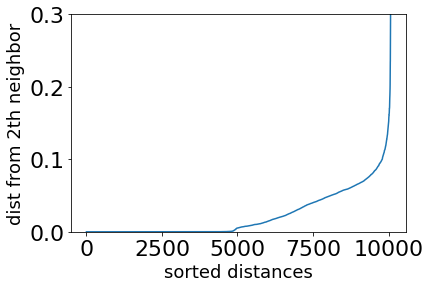

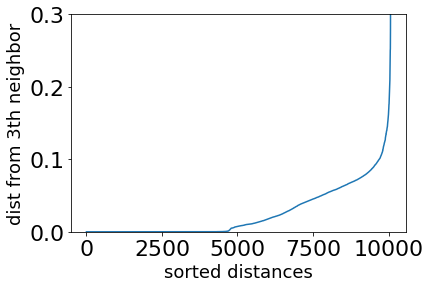

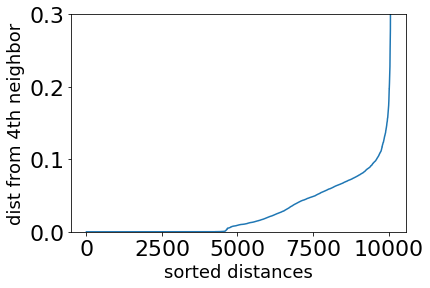

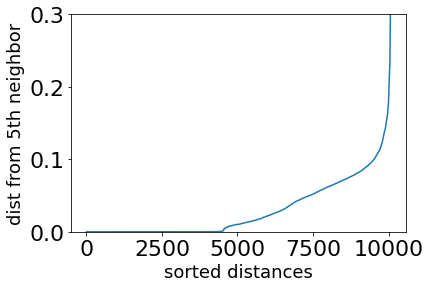

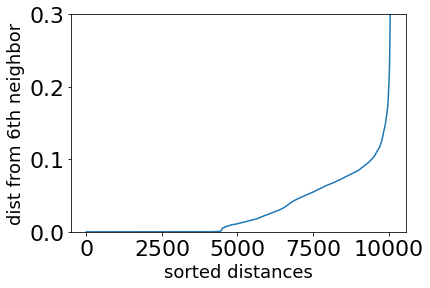

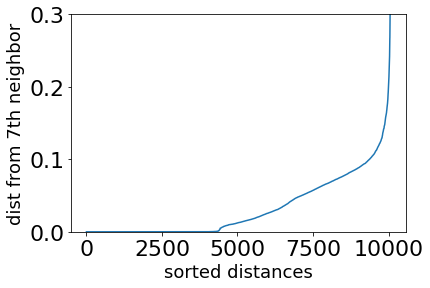

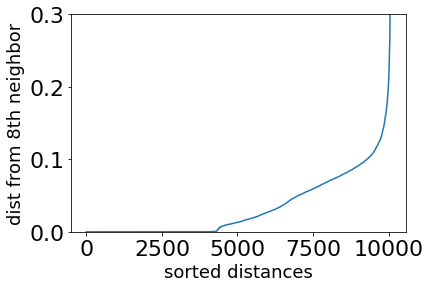

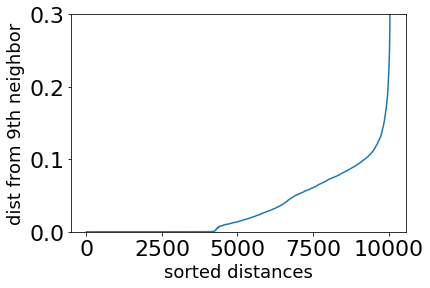

In [13]:
counter = 0
for i in kth_distances:
    plt.plot(range(0, len(i)), sorted(i))
    plt.ylabel('dist from %sth neighbor' % str(counter + 2), fontsize=18)
    plt.xlabel('sorted distances', fontsize=18)
    plt.tick_params(axis='both', which='major', labelsize=22)
    plt.ylim([0,0.3])
    plt.show()
    counter += 1

We have chosen the best distances using the Elbow method.

In [14]:
best_distance = [0.059, 0.059, 0.06, 0.06, 0.06, 0.06, 0.065, 0.068]
dbscan = []
counter = 0

for i in best_distance:
    dbscan.append(DBSCAN(eps=i, min_samples=counter + 2).fit(X))
    counter += 1

As we can see, for almost every number of neighbors there are three different major clusters identified. Indeed there is always a cluster with about 5500 points, which is the biggest one, and then there are two other smaller clusters which have about 1200 points. Then there are also a lot of noise points; they could be reduced raising the radius of the algorithm, but in this way the algorithm would not be able to recognize the clusters anymore. If the number of neighbours is small, there are also a lot of small clusters with just few points.

In [15]:
counter_i = 0
for i in dbscan:
    counter_j = 0
    print("DBSCAN with " + str(counter_i + 2) + " neighbors:\n", "Noise Points: " + str(np.unique(i.labels_, return_counts=True)[1][0]) + "\n", "Points in the other clusters:")
    for j in np.unique(i.labels_, return_counts=True)[1]:
        if counter_j != 0:
            print("Cluster " +  str(counter_j) + ": " + str(j) + "   ", end = '')
            if counter_j % 5 == 0:
                print("")
        counter_j += 1
    print("\n")
    counter_i += 1

DBSCAN with 2 neighbors:
 Noise Points: 956
 Points in the other clusters:
Cluster 1: 1285   Cluster 2: 46   Cluster 3: 2   Cluster 4: 2   Cluster 5: 2   
Cluster 6: 5   Cluster 7: 11   Cluster 8: 4   Cluster 9: 6   Cluster 10: 3   
Cluster 11: 2   Cluster 12: 2   Cluster 13: 6   Cluster 14: 3   Cluster 15: 2   
Cluster 16: 4   Cluster 17: 8   Cluster 18: 4   Cluster 19: 3   Cluster 20: 6   
Cluster 21: 2   Cluster 22: 3   Cluster 23: 2   Cluster 24: 2   Cluster 25: 98   
Cluster 26: 2   Cluster 27: 27   Cluster 28: 2   Cluster 29: 2   Cluster 30: 4   
Cluster 31: 2   Cluster 32: 5   Cluster 33: 2   Cluster 34: 2   Cluster 35: 6   
Cluster 36: 2   Cluster 37: 3   Cluster 38: 2   Cluster 39: 2   Cluster 40: 2   
Cluster 41: 2   Cluster 42: 2   Cluster 43: 2   Cluster 44: 2   Cluster 45: 3   
Cluster 46: 2   Cluster 47: 2   Cluster 48: 39   Cluster 49: 5   Cluster 50: 2   
Cluster 51: 3   Cluster 52: 3   Cluster 53: 3   Cluster 54: 2   Cluster 55: 2   
Cluster 56: 2   Cluster 57: 3   Clu

Plotting the results for __min_saples == 9__.

(Be careful, in the graphs there are two different coulors of purple)

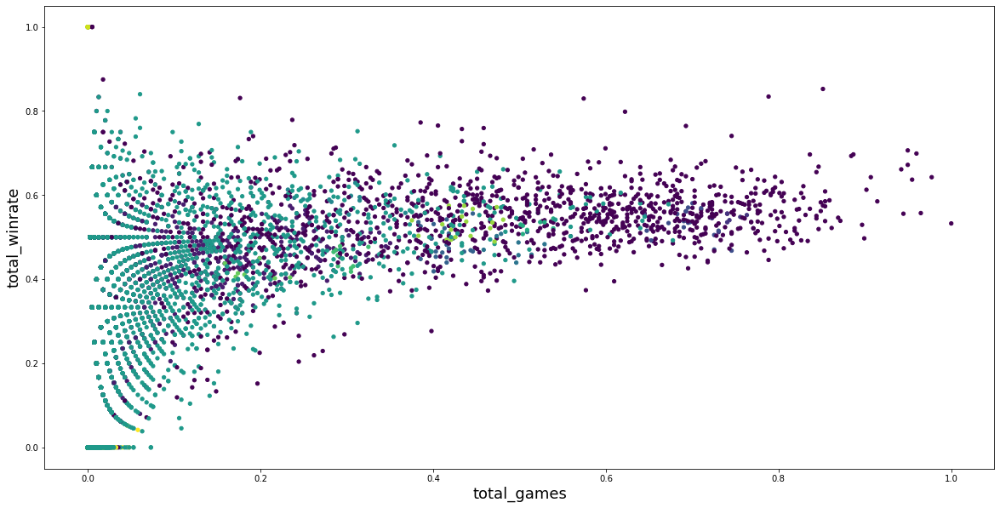

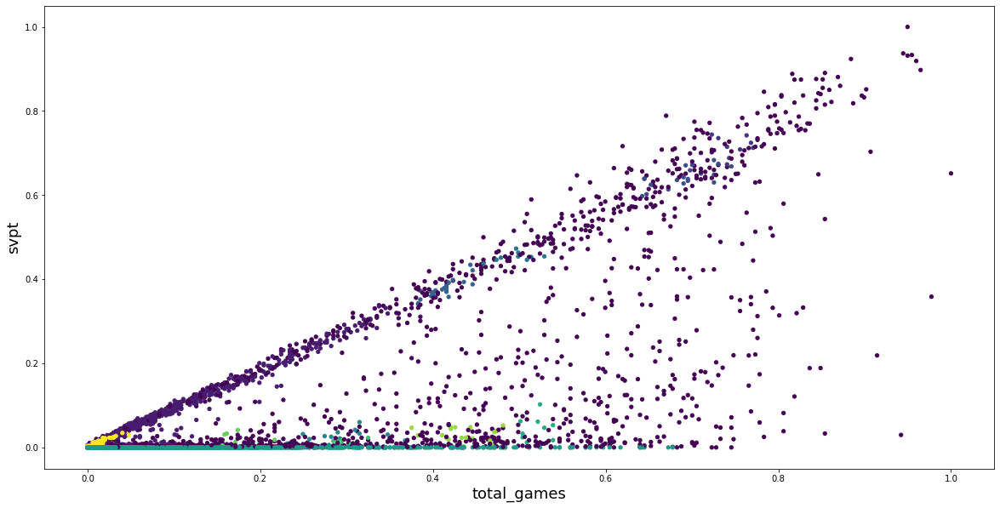

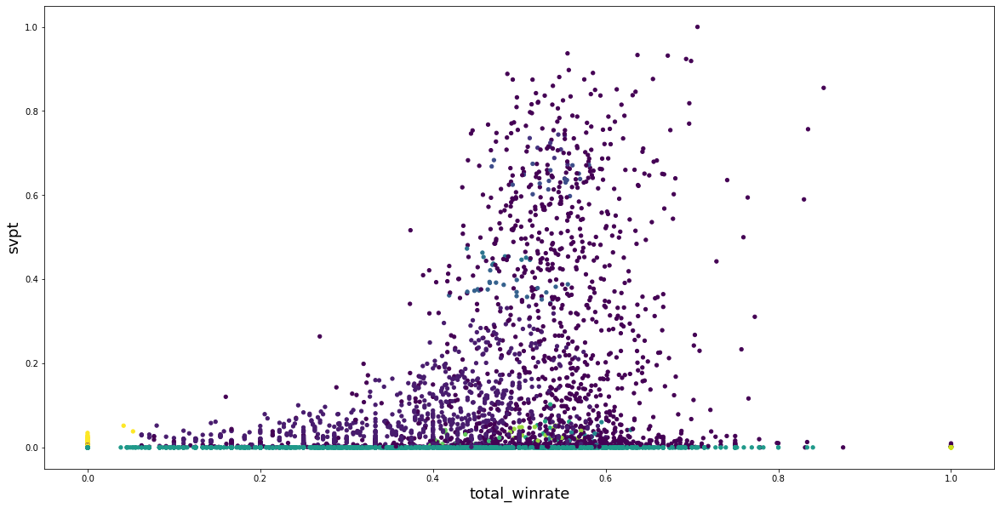

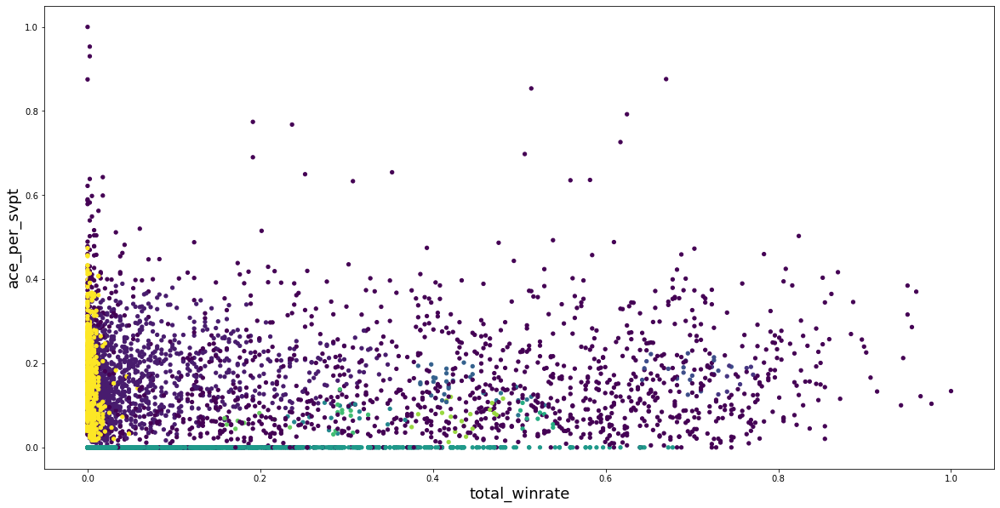

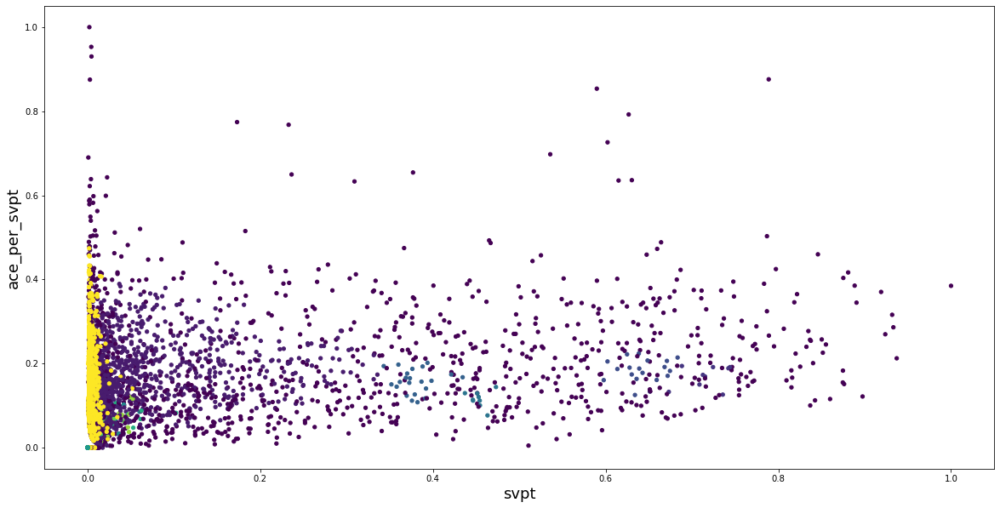

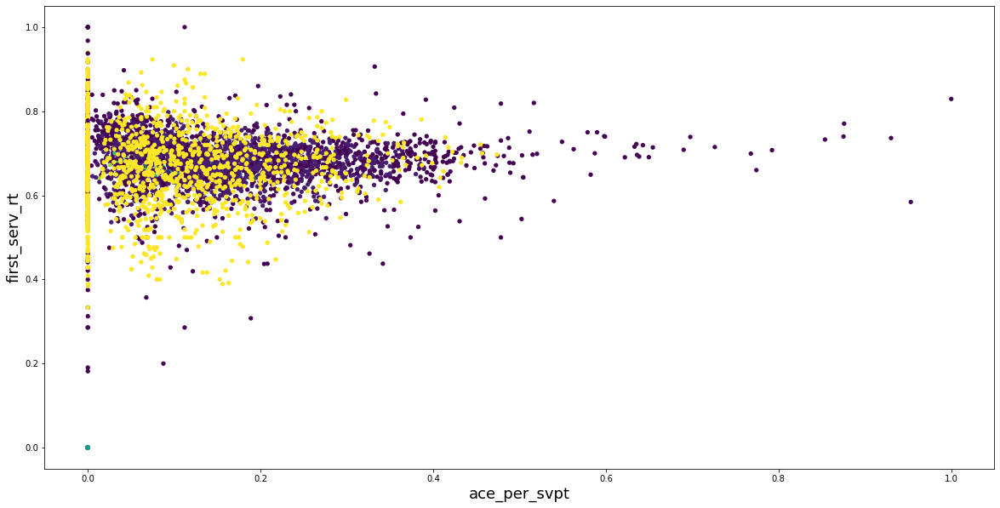

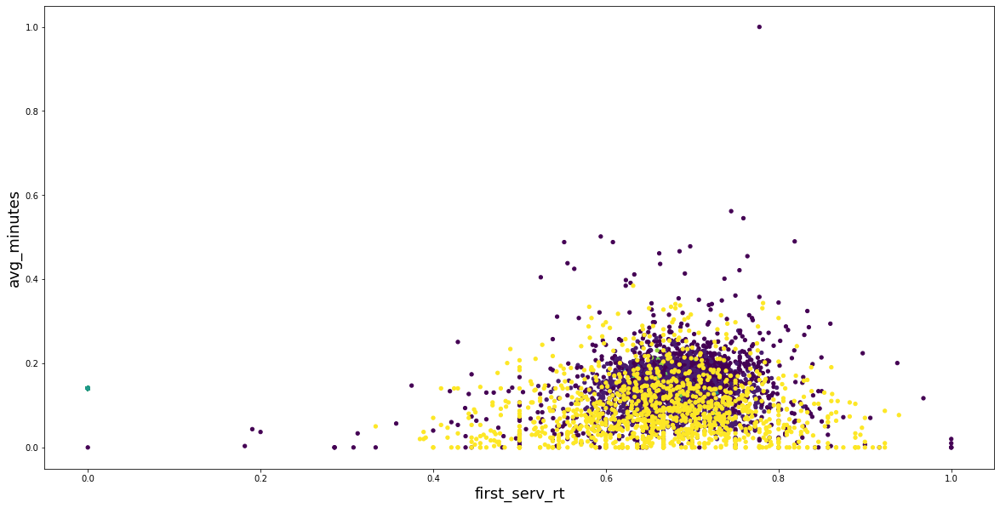

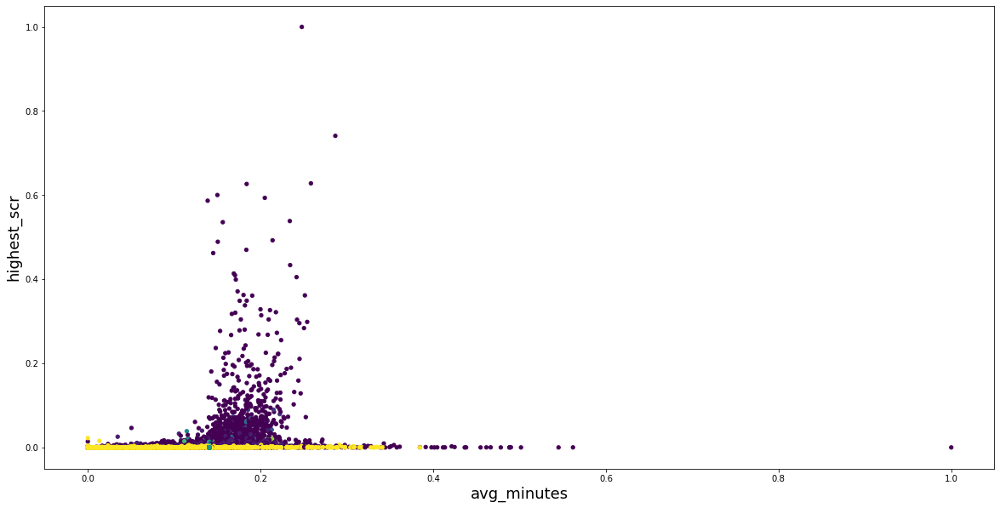

In [16]:
plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,1], s=18, c=dbscan[7].labels_) #Attributes "total_games" and "total_winrate"
plt.xlabel("total_games", fontsize=18)
plt.ylabel("total_winrate", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,2], s=18, c=dbscan[7].labels_) #Attributes "total_games" and "svpt"
plt.xlabel("total_games", fontsize=18)
plt.ylabel("svpt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,1],X[:,2], s=18, c=dbscan[7].labels_) #Attributes "total_winrate" and "svpt"
plt.xlabel("total_winrate", fontsize=18)
plt.ylabel("svpt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,3], s=18, c=dbscan[7].labels_) #Attributes "total_winrate" and "ace_per_svpt"
plt.xlabel("total_winrate", fontsize=18)
plt.ylabel("ace_per_svpt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,2],X[:,3], s=18, c=dbscan[7].labels_) #Attributes "svpt" and "ace_per_svpt"
plt.xlabel("svpt", fontsize=18)
plt.ylabel("ace_per_svpt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,3],X[:,4], s=18, c=dbscan[7].labels_) #Attributes "ace_per_svpt" and "first_serv_rt"
plt.xlabel("ace_per_svpt", fontsize=18)
plt.ylabel("first_serv_rt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,4],X[:,5], s=18, c=dbscan[7].labels_) #Attributes "first_serv_rt" and "avg_minutes"
plt.xlabel("first_serv_rt", fontsize=18)
plt.ylabel("avg_minutes", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,5],X[:,6], s=18, c=dbscan[7].labels_) #Attributes "avg_minutes" and "highest_scr"
plt.xlabel("avg_minutes", fontsize=18)
plt.ylabel("highest_scr", fontsize=18)
plt.show()

Plotting the charts for min_saples == 2.

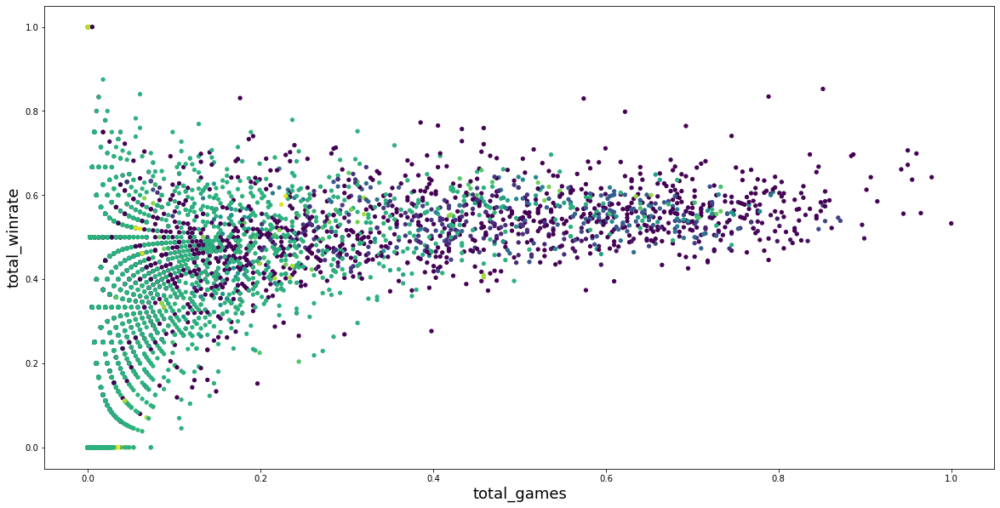

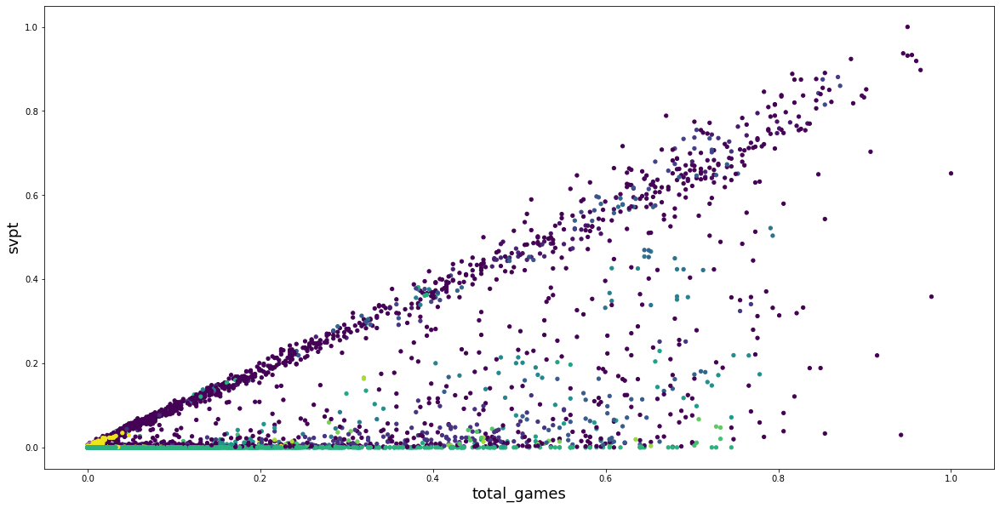

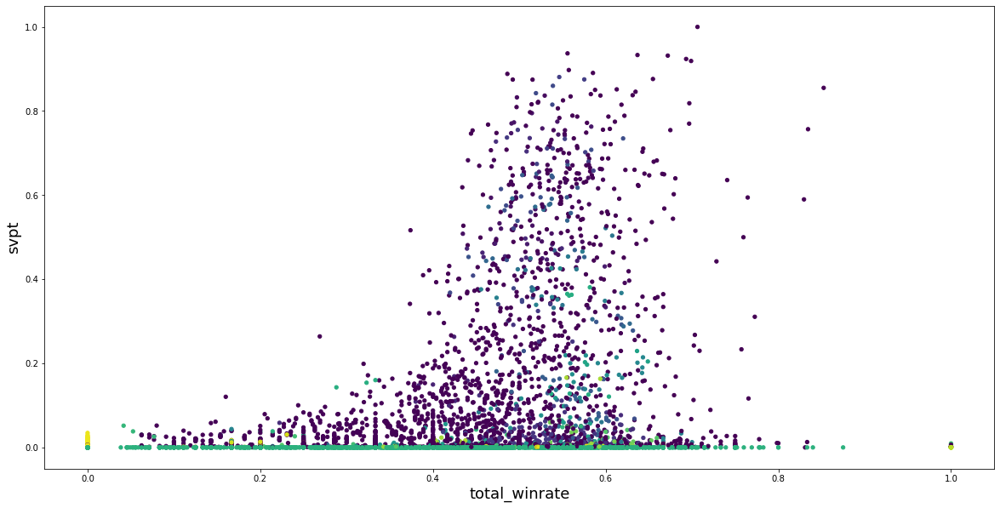

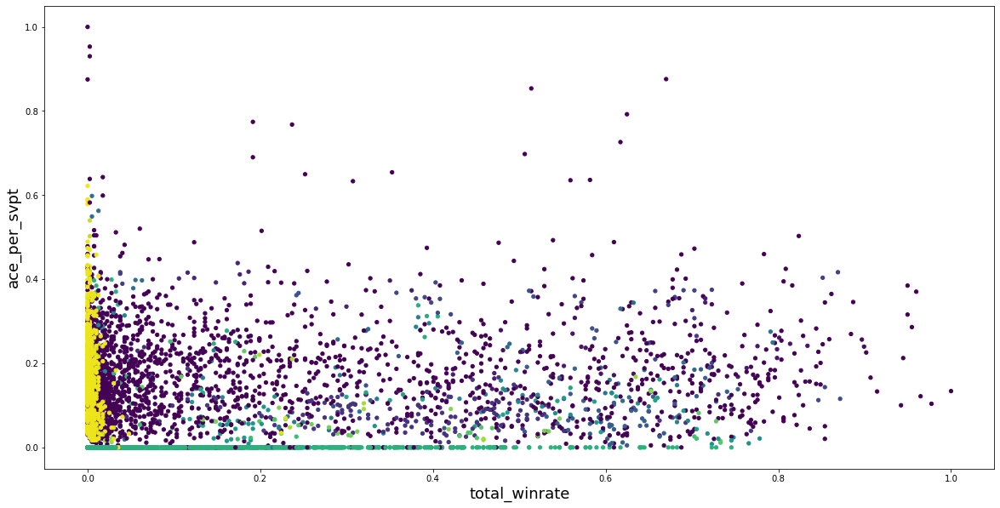

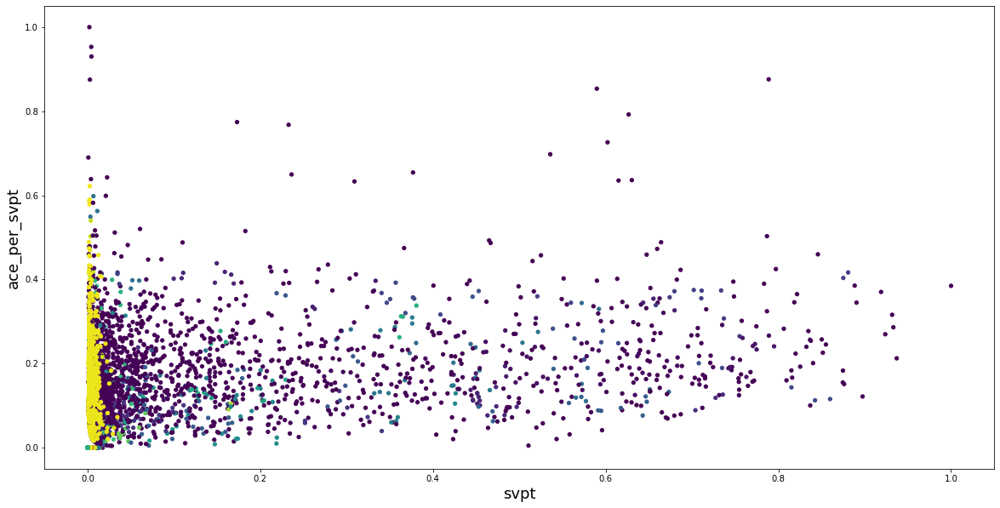

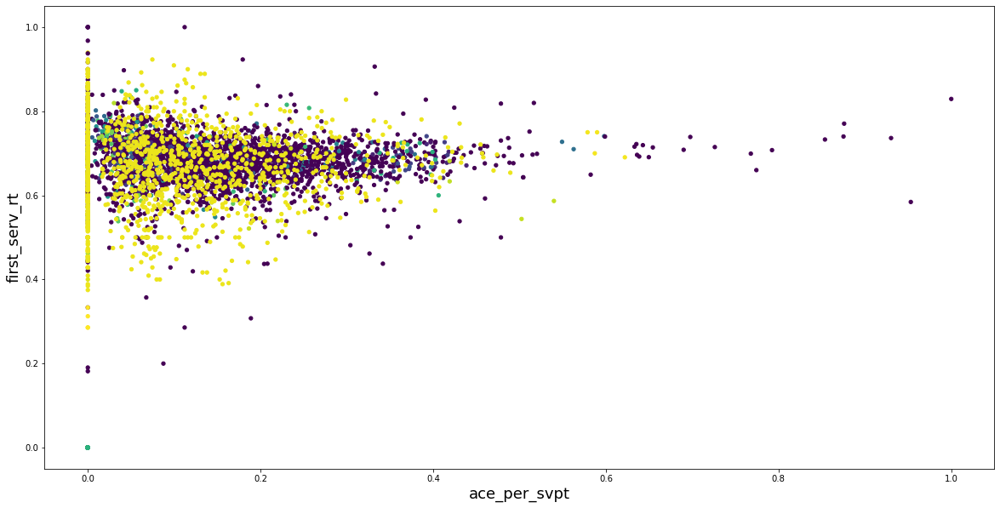

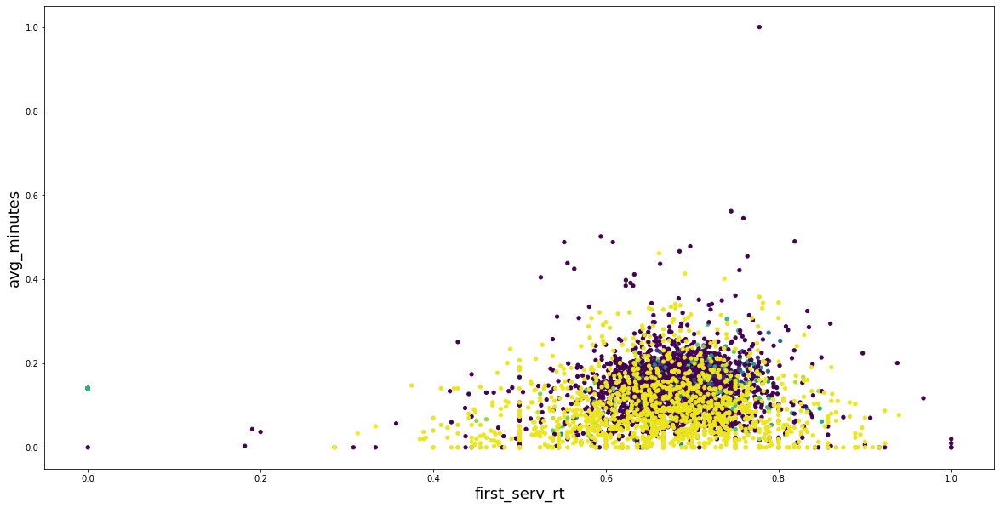

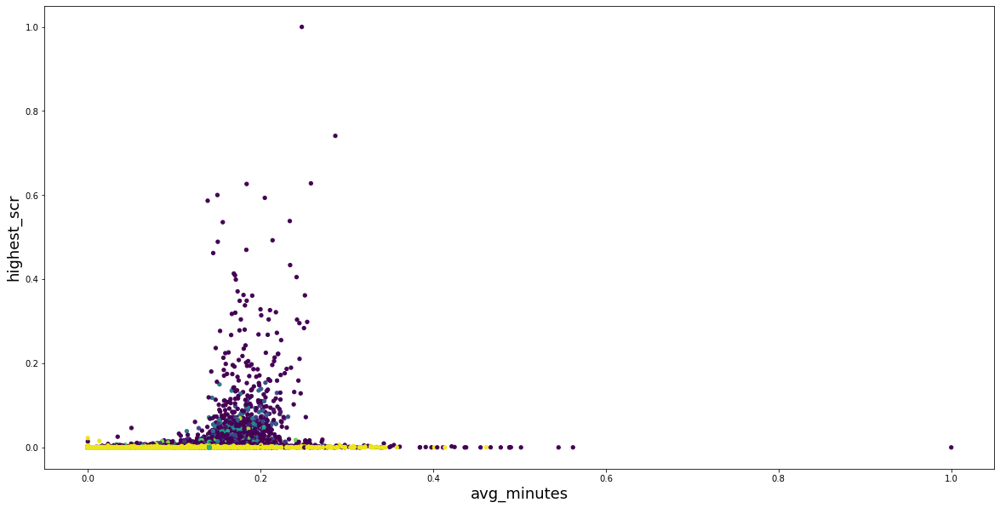

In [17]:
plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,1], s=18, c=dbscan[0].labels_) #Attributes "total_games" and "total_winrate"
plt.xlabel("total_games", fontsize=18)
plt.ylabel("total_winrate", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,2], s=18, c=dbscan[0].labels_) #Attributes "total_games" and "svpt"
plt.xlabel("total_games", fontsize=18)
plt.ylabel("svpt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,1],X[:,2], s=18, c=dbscan[0].labels_) #Attributes "total_winrate" and "svpt"
plt.xlabel("total_winrate", fontsize=18)
plt.ylabel("svpt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,3], s=18, c=dbscan[0].labels_) #Attributes "total_winrate" and "ace_per_svpt"
plt.xlabel("total_winrate", fontsize=18)
plt.ylabel("ace_per_svpt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,2],X[:,3], s=18, c=dbscan[0].labels_) #Attributes "svpt" and "ace_per_svpt"
plt.xlabel("svpt", fontsize=18)
plt.ylabel("ace_per_svpt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,3],X[:,4], s=18, c=dbscan[0].labels_) #Attributes "ace_per_svpt" and "first_serv_rt"
plt.xlabel("ace_per_svpt", fontsize=18)
plt.ylabel("first_serv_rt", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,4],X[:,5], s=18, c=dbscan[0].labels_) #Attributes "first_serv_rt" and "avg_minutes"
plt.xlabel("first_serv_rt", fontsize=18)
plt.ylabel("avg_minutes", fontsize=18)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,5],X[:,6], s=18, c=dbscan[0].labels_) #Attributes "avg_minutes" and "highest_scr"
plt.xlabel("avg_minutes", fontsize=18)
plt.ylabel("highest_scr", fontsize=18)
plt.show()

# Hierarchical Clustering #

In [18]:
from scipy.stats import mode
from scipy.spatial.distance import pdist
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import linkage, dendrogram

For hierarchical clustering, our approach is to compare different merging strategies. In our analysis, we have considered the following methods: __ward__, __single__, __complete__, __centroid__, and __average__. 
First of all, we compared the dendrograms to find the number of clusters, in this phase, we have set a threshold to define the clusters.

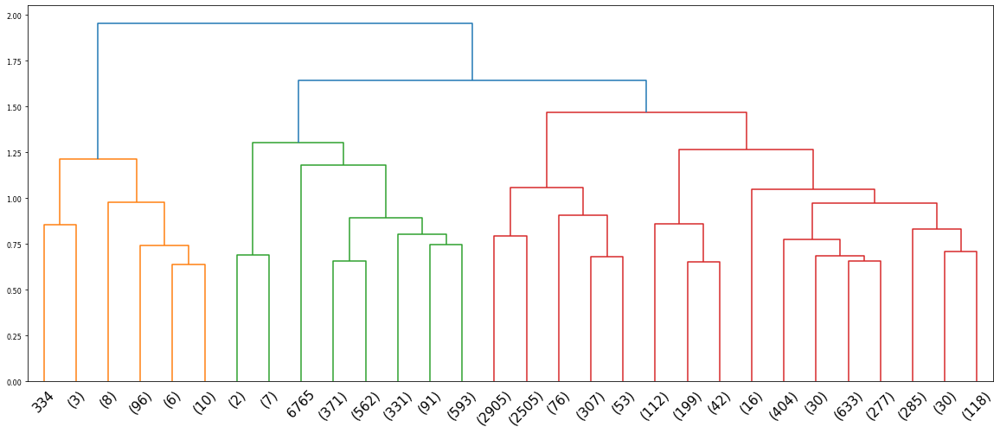

In [19]:
data_dist = pdist(X, metric='euclidean')
data_link = linkage(data_dist, method='complete', metric='euclidean') #using the Furthest Point algorithm

#create the dendrogram
fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1, 1, 1)
d = dendrogram(data_link, color_threshold=1.5, truncate_mode='lastp')
ax.tick_params(axis='x', which='major', labelsize=15)
ax.tick_params(axis='y', which='major', labelsize=8)

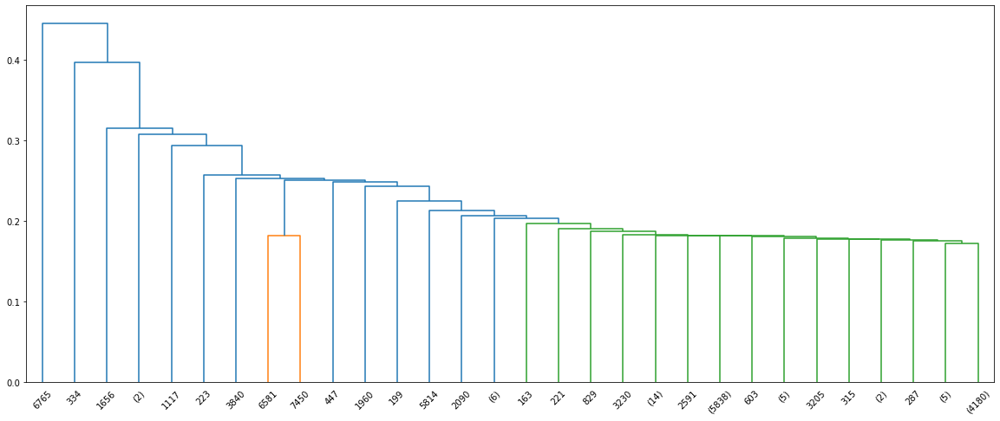

In [20]:
data_dist = pdist(X, metric='euclidean')
data_link = linkage(data_dist, method='single', metric='euclidean') #using the Nearest Point algorithm.

#create the dendrogram
ig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1, 1, 1)
dendrogram(data_link, color_threshold=0.2, truncate_mode='lastp')
ax.tick_params(axis='x', which='major', labelsize=15)
ax.tick_params(axis='y', which='major', labelsize=8)

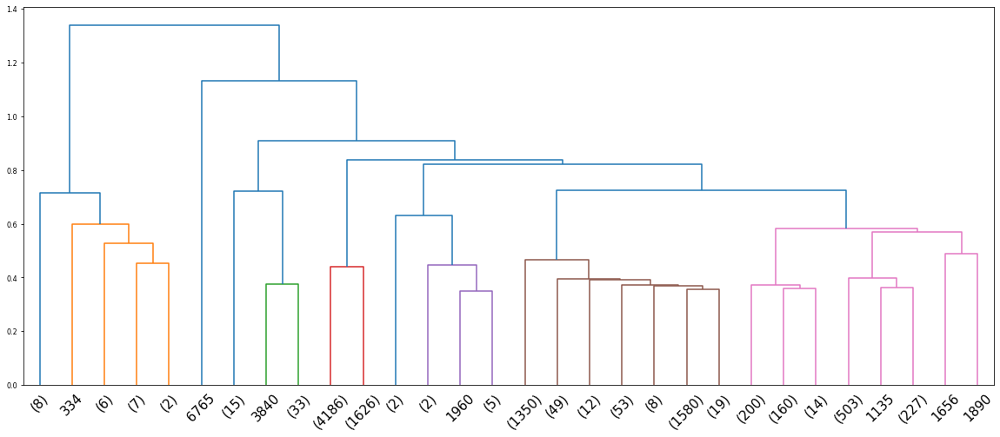

In [21]:
data_dist = pdist(X, metric='euclidean')
data_link = linkage(data_dist, method='average', metric='euclidean') #using the UPGMA algorithm

#create the dendrogram
fig2 = plt.figure(figsize=(20,8))
ax = fig2.add_subplot(1, 1, 1)
dendrogram(data_link, color_threshold=0.6, truncate_mode='lastp')
ax.tick_params(axis='x', which='major', labelsize=15)
ax.tick_params(axis='y', which='major', labelsize=8)

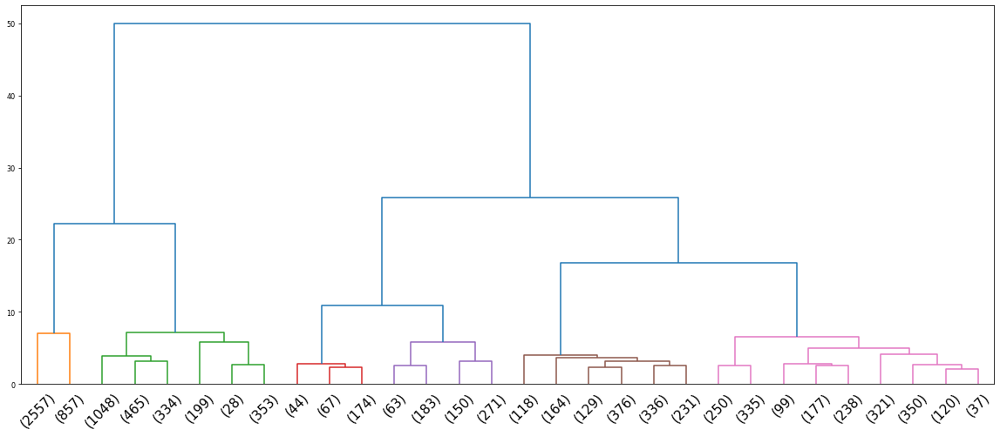

In [22]:
data_dist = pdist(X, metric='euclidean')
data_link = linkage(data_dist, method='ward', metric='euclidean') #ward

#create dendrogram
fig2 = plt.figure(figsize=(20,8))
ax = fig2.add_subplot(1, 1, 1)
dendrogram(data_link, color_threshold=10, truncate_mode='lastp')
ax.tick_params(axis='x', which='major', labelsize=15)
ax.tick_params(axis='y', which='major', labelsize=8)

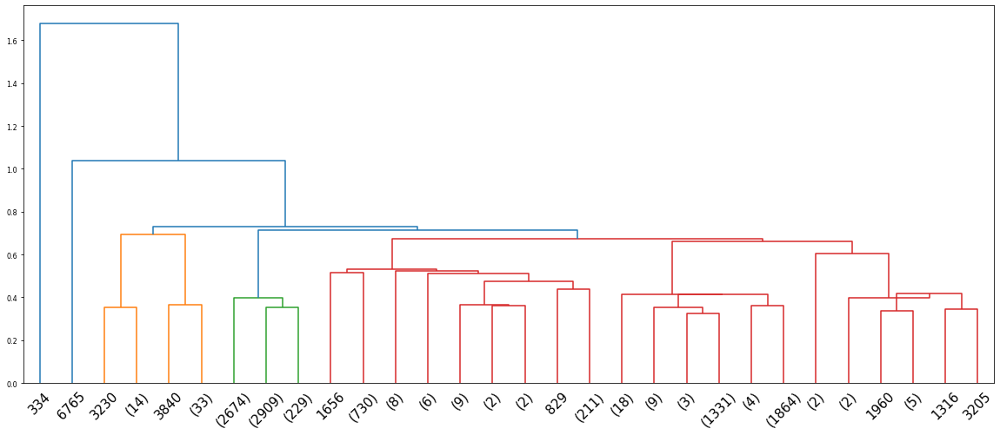

In [23]:
data_dist = pdist(X, metric='euclidean')
data_link = linkage(data_dist, method='centroid', metric='euclidean') #using the UPGMC algorithm

#create dendrogram
fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1, 1, 1)
d = dendrogram(data_link, color_threshold=0.7, truncate_mode='lastp')
ax.tick_params(axis='x', which='major', labelsize=15)
ax.tick_params(axis='y', which='major', labelsize=8)

Every dendrogram uses different merging strategies as said previously. We have seen that the __single__ method did not give us a good result, we have noticed that this is a step chart. It is difficult to identify the clusters with this graph.
Instead of the __ward__ method defines in a clear way the clusters with respect to the __single__ method.
The other dendrograms are more or less the same, the differences are slight between them, we have noticed that the __complete__ method shows in a more defined manner the clusters with respect to __centroid__ and __average__ methods.

After that we compared the dendrograms, we have compared the clustering results using the dendrograms' results about the number of clusters.

In [24]:
from sklearn.cluster import AgglomerativeClustering

#apply agglomerative clustering with 'ward' method
clusterWard = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='ward')
clusterWard.fit_predict(X)

array([3, 3, 5, ..., 1, 1, 1])

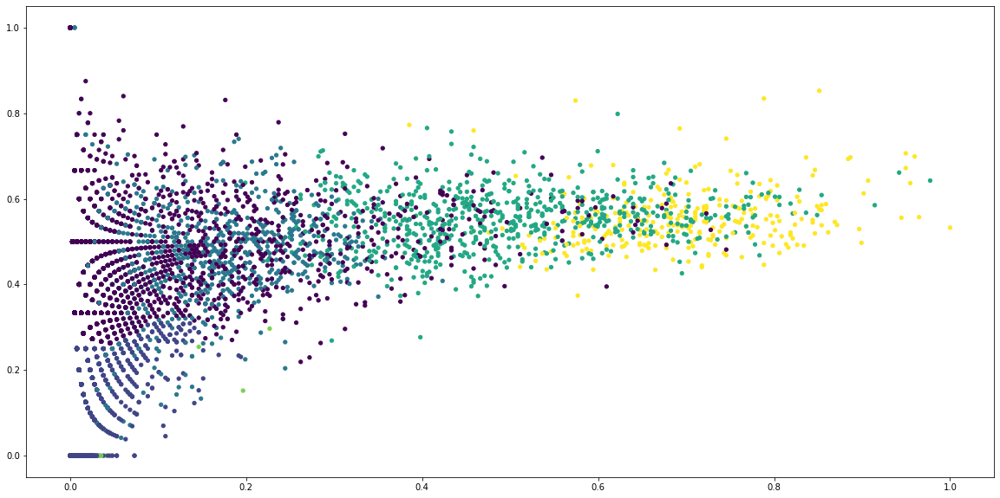

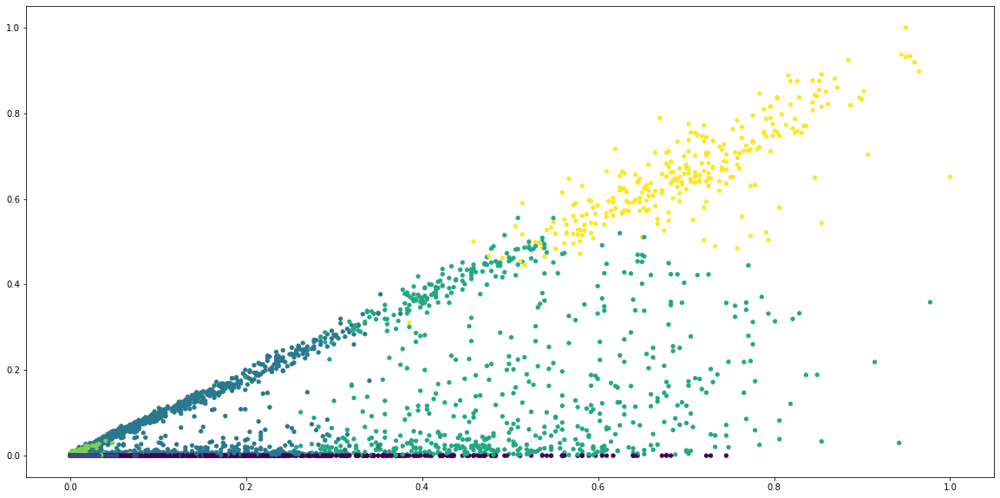

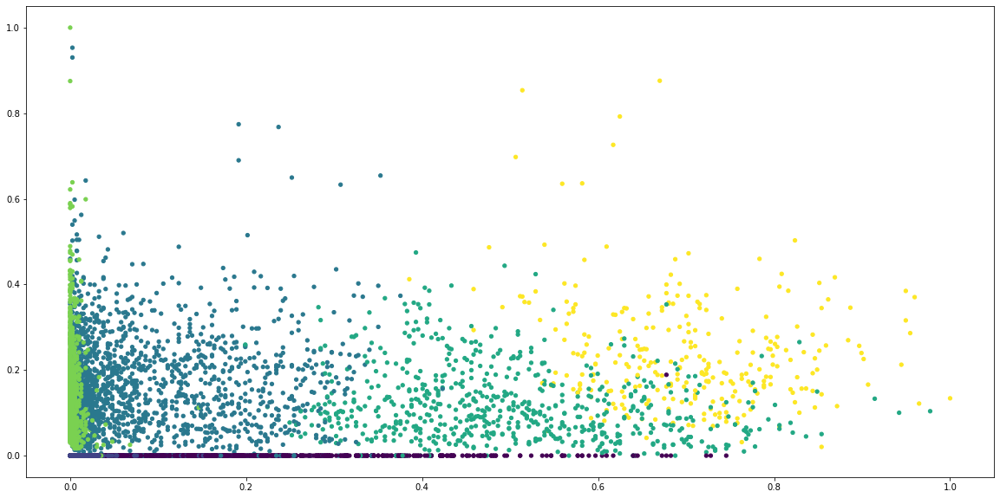

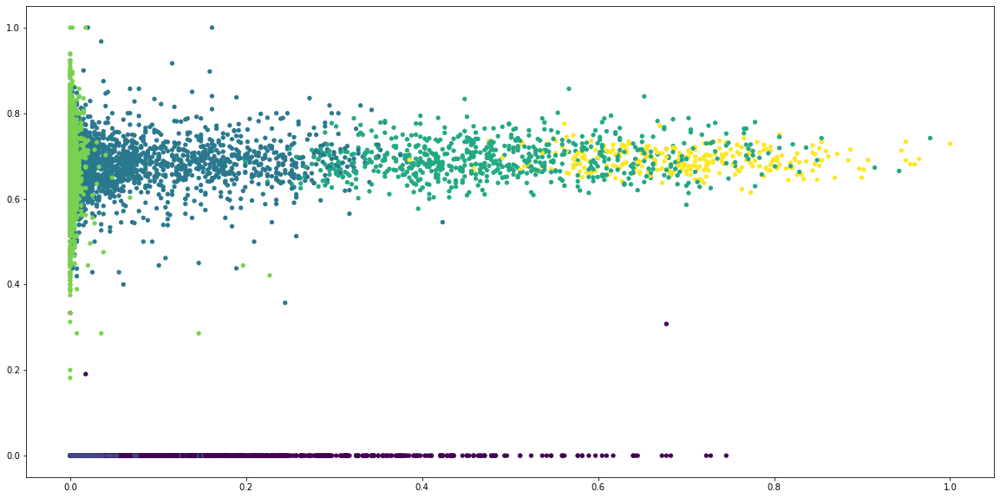

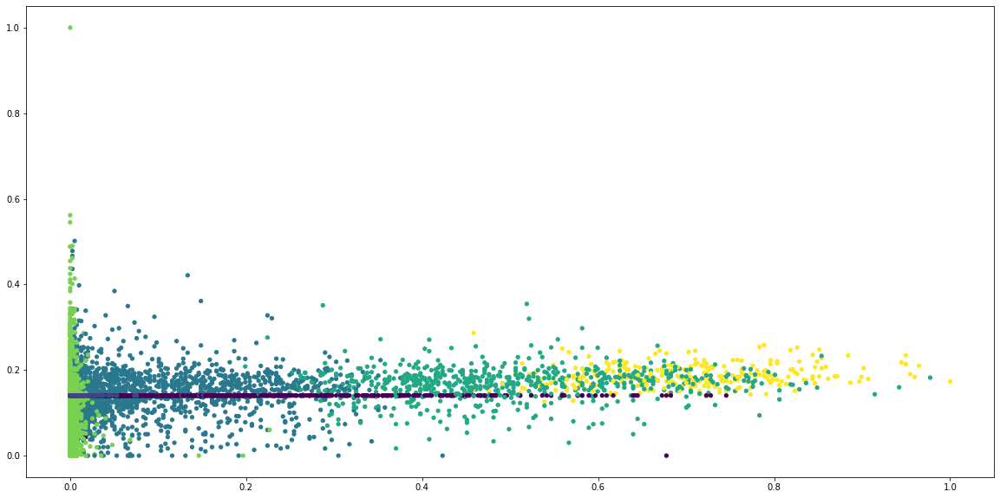

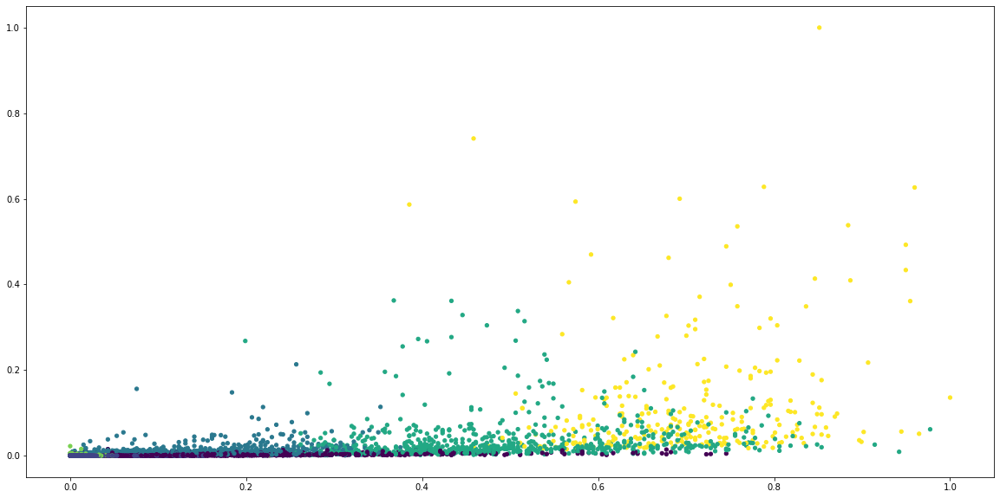

In [25]:
#create different plots to analyze it
plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,1], s=18, c=clusterWard.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,2], s=18, c=clusterWard.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,3], s=18, c=clusterWard.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,4], s=18, c=clusterWard.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,5], s=18, c=clusterWard.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,6], s=18, c=clusterWard.labels_)
plt.show()

In [26]:
#apply agglomerative clustering with 'single' method
clusterMin = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='single')
clusterMin.fit_predict(X)

array([0, 0, 0, ..., 0, 0, 0])

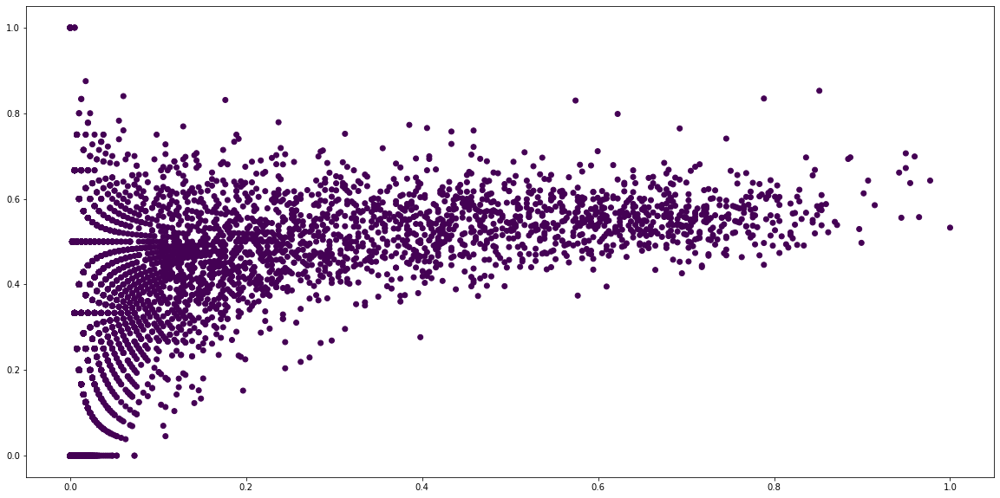

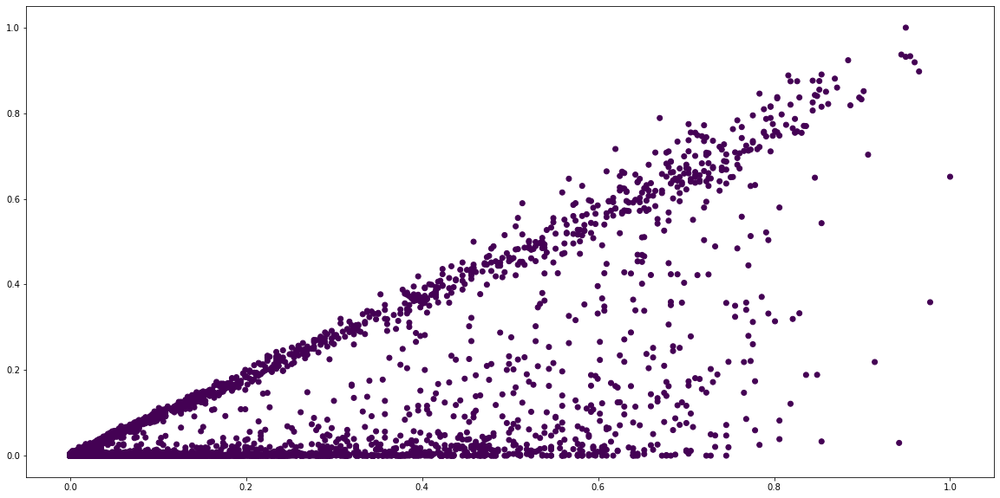

In [27]:
#create different plots to analyze it
plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,1], c=clusterMin.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,2], c=clusterMin.labels_)
plt.show()

In [28]:
#apply agglomerative clustering with 'complete' method
clusterMax = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete')
clusterMax.fit_predict(X)

array([0, 0, 0, ..., 0, 0, 0])

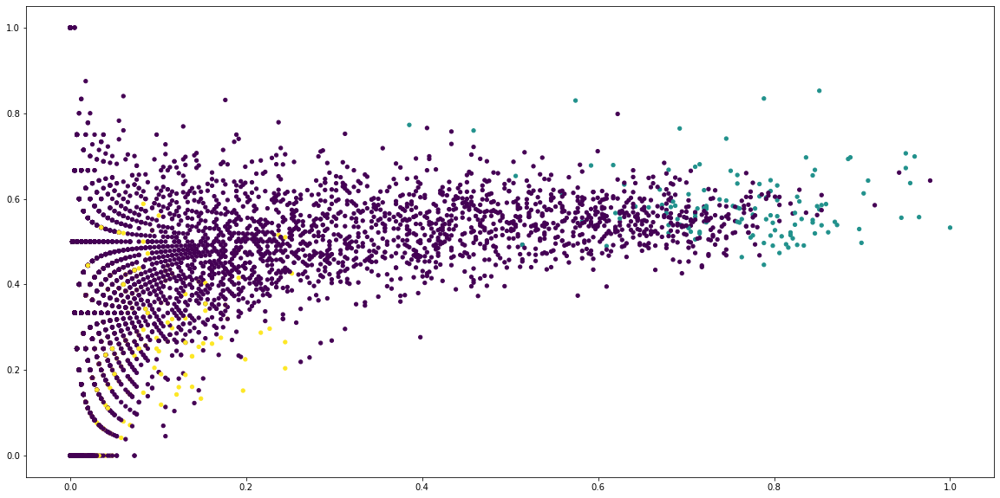

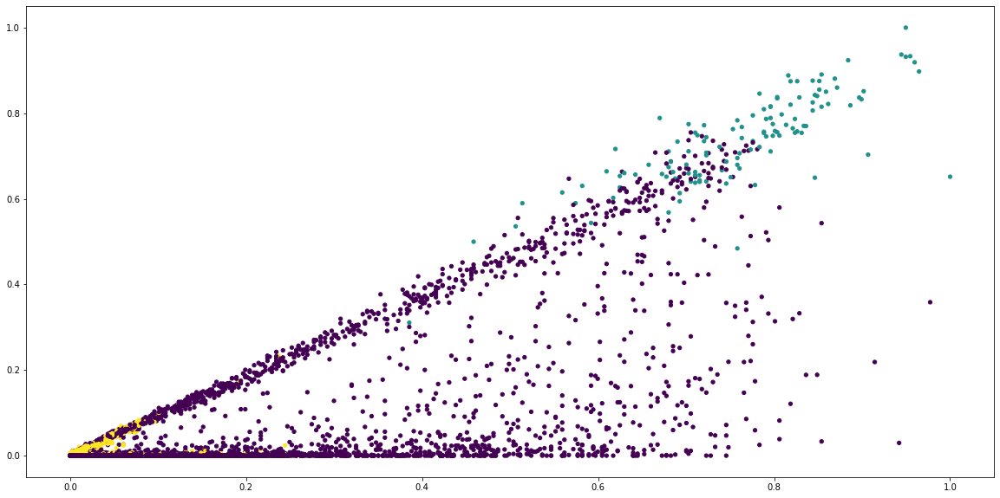

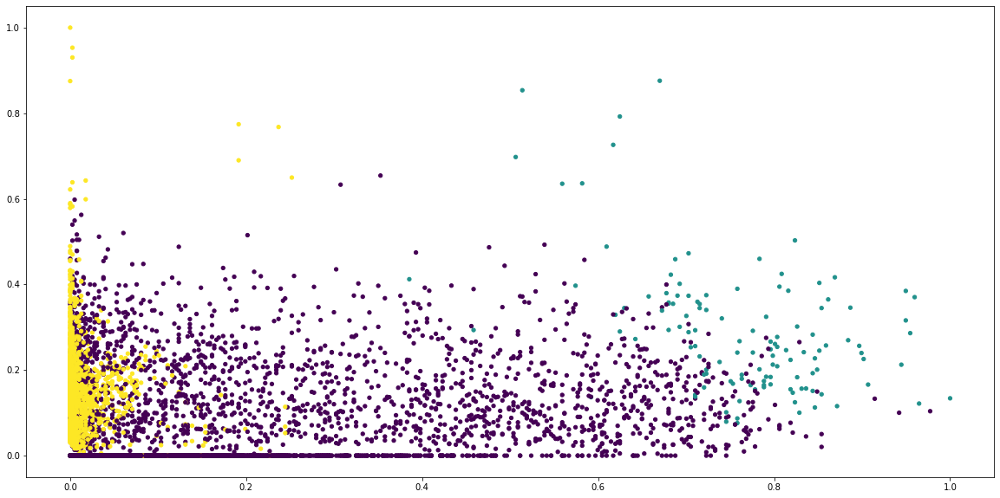

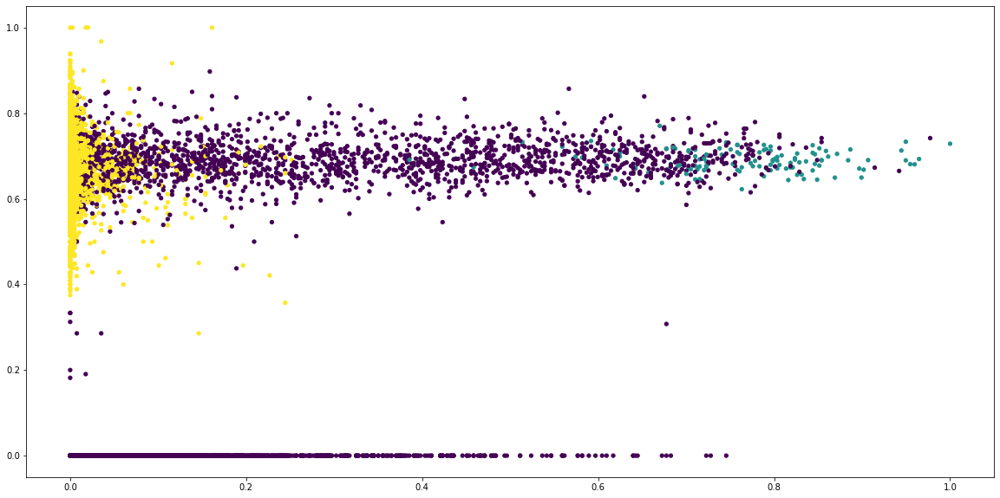

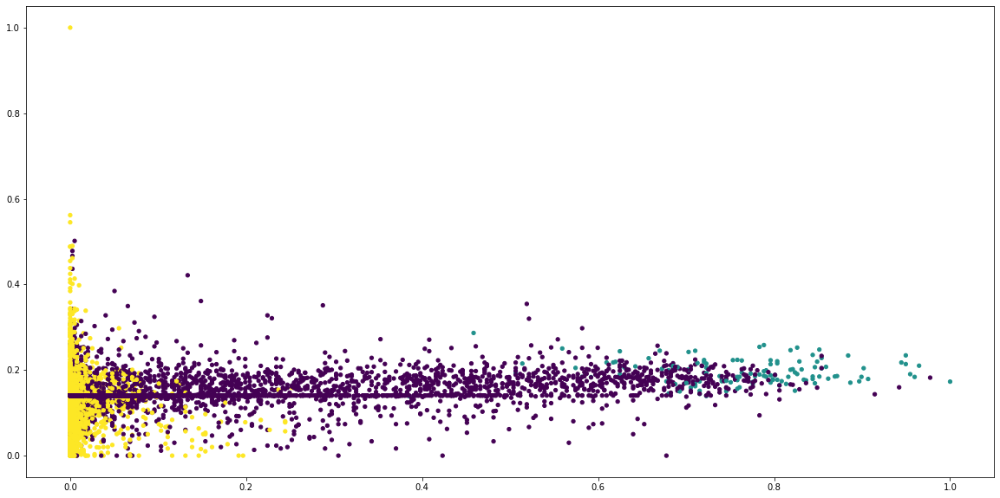

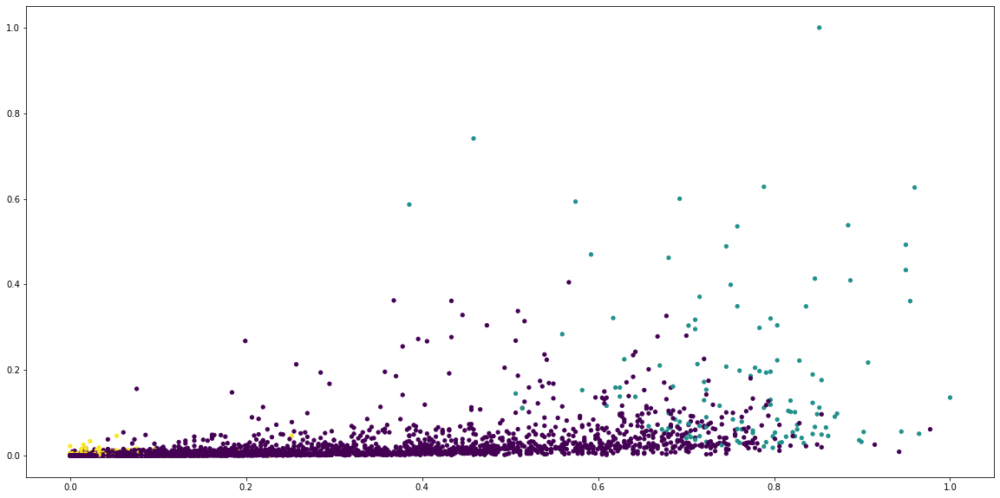

In [29]:
#create different plots to analyze it
plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,1], s=18, c=clusterMax.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,2], s=18, c=clusterMax.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,3], s=18, c=clusterMax.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,4], s=18, c=clusterMax.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,5], s=18, c=clusterMax.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,6], s=18, c=clusterMax.labels_)
plt.show()

In [30]:
#apply agglomerative clustering with 'average' method
clusterAverage = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='average')
clusterAverage.fit_predict(X)

array([0, 0, 0, ..., 0, 0, 0])

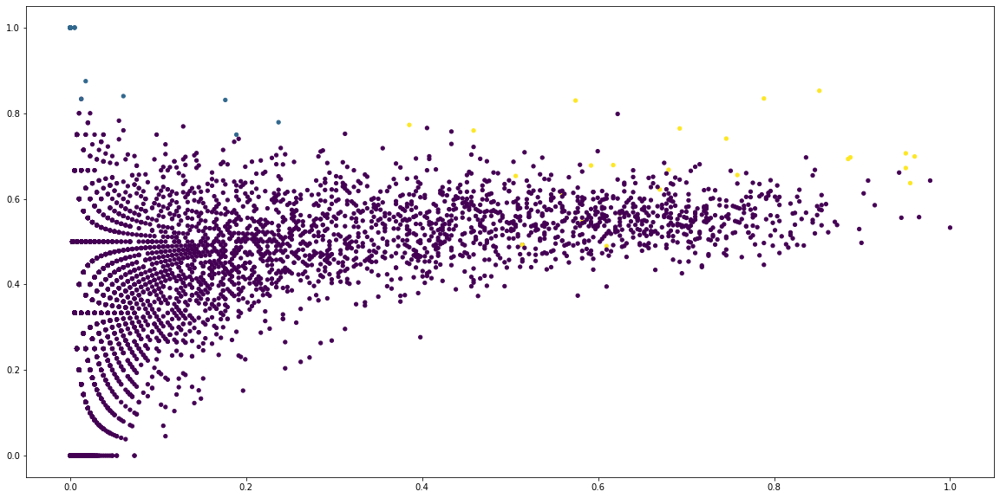

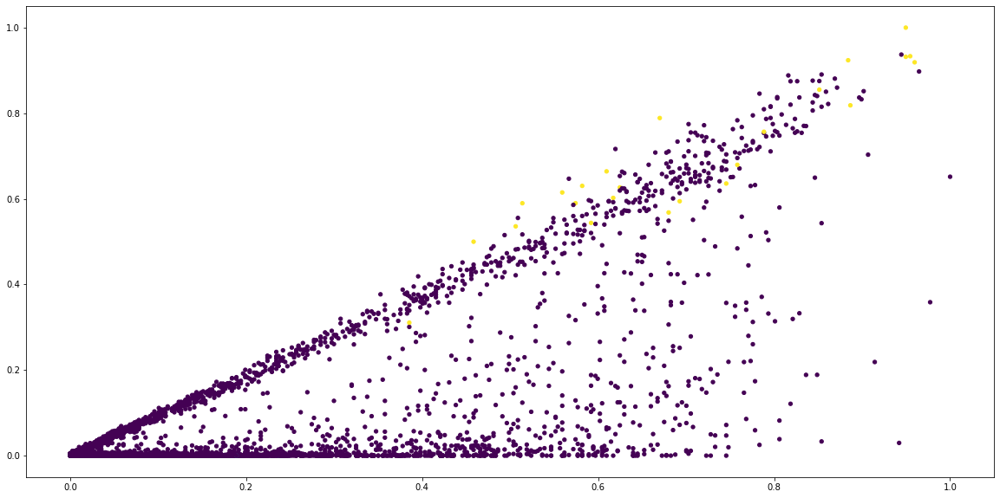

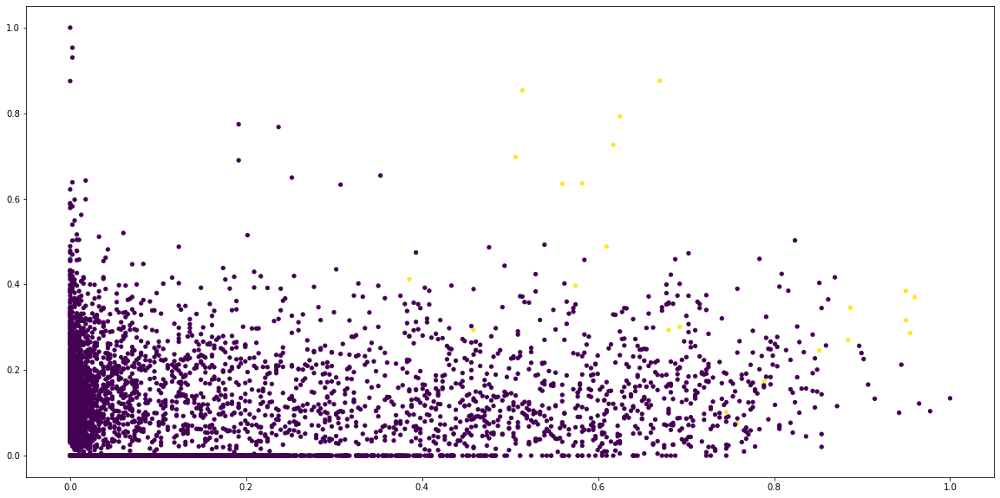

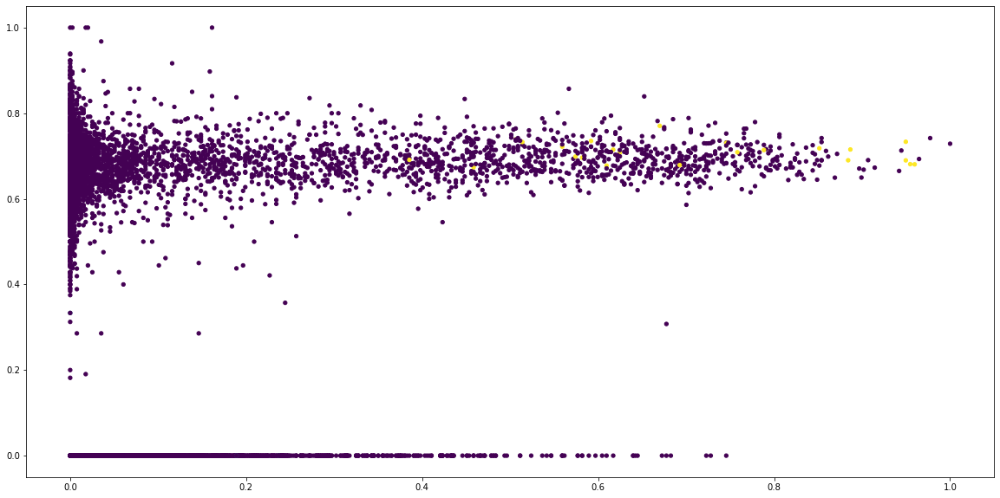

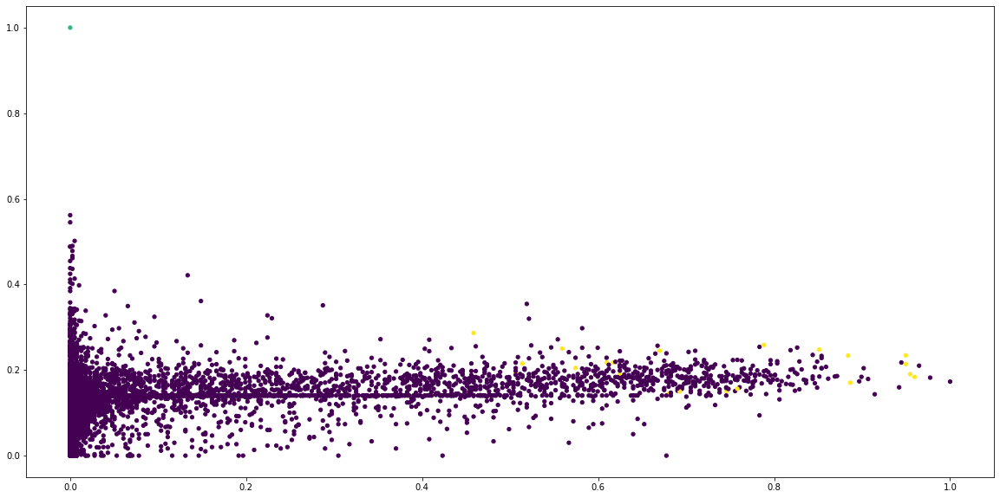

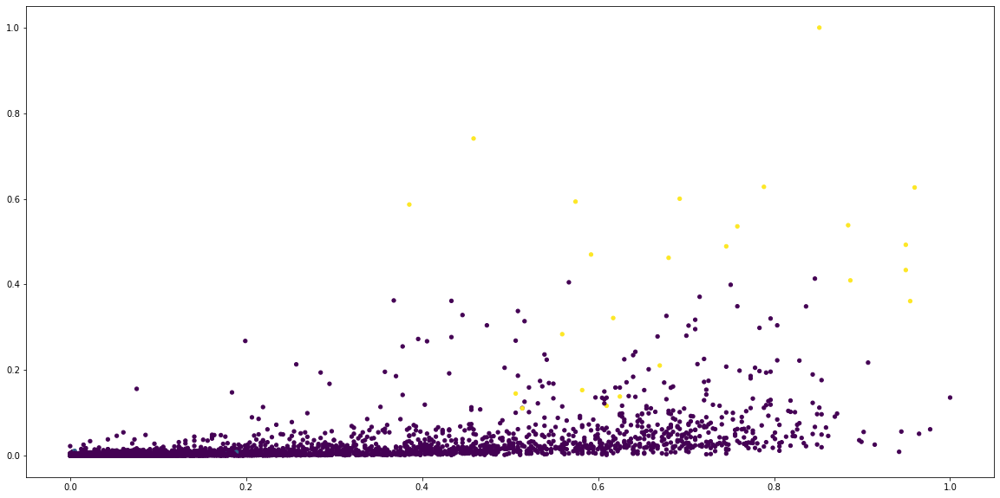

In [31]:
#create different plots to analyze it
plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,1], s=18, c=clusterAverage.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,2], s=18, c=clusterAverage.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,3], s=18, c=clusterAverage.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,4], s=18, c=clusterAverage.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,5], s=18, c=clusterAverage.labels_)
plt.show()

plt.figure(figsize=(20,10))
plt.scatter(X[:,0],X[:,6], s=18, c=clusterAverage.labels_)
plt.show()

Our results confirm that the __single__ method is very bad, in fact, the plot shows a cluster.
Instead of the other graphs show a better distribution of data defining more or less the clusters in a proper way. 
The better result obtained is the __ward__ and __average__ methods: the first one is better with respect to the second one. 

# KMeans

In [32]:
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

We first want to capture many ks and try many different initializations of KMeans 

In [33]:
kmeanselbow = list()  # the list where we'll save all the kmeans objects
silh_list   = list()  # the list where we'll save the silhouette score values for each k
sse_list    = list()  # the list where we'll save the sum of squared errors for each k
max_k       = 30      # the maximum number of k we'll test for

for k in range(2,max_k+1):
    kmeanselbow.append(KMeans(n_clusters=k, n_init=12, max_iter=200, verbose=0))
    kmeanselbow[-1].fit(X)
    
    sse = kmeanselbow[-1].inertia_
    silh = metrics.silhouette_score(X, kmeanselbow[-1].labels_)
    
    sse_list.append(sse)
    silh_list.append(silh)

Now we want to use the elbow method to refine our search and get less candidate ks

We'll investigate both the SSE...

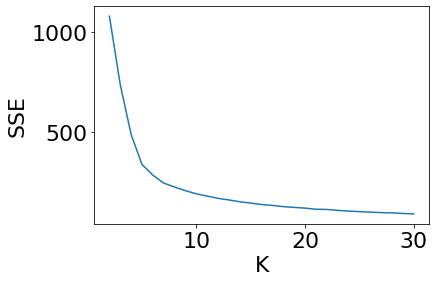

In [34]:
plt.plot(range(2, len(sse_list)+2), sse_list)
plt.ylabel('SSE', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

...  and the Silhouette score

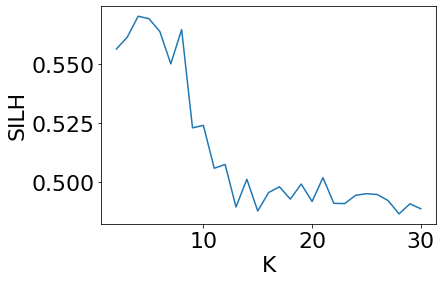

In [35]:
plt.plot(range(2, len(silh_list)+2), silh_list)
plt.ylabel('SILH', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

We can see that the best ks occur between 4 and 15.

Let's see in more detail how the Silhouette score behaves 

For n_cluster 4 the avg SILH is 0.5636914678567505
For n_cluster 5 the avg SILH is 0.5501014586114541
For n_cluster 6 the avg SILH is 0.5086674564932706
For n_cluster 7 the avg SILH is 0.5635374109737085
For n_cluster 8 the avg SILH is 0.5269821761470427
For n_cluster 9 the avg SILH is 0.5216178546821807
For n_cluster 10 the avg SILH is 0.5071507622886635
For n_cluster 11 the avg SILH is 0.5052389246801204
For n_cluster 12 the avg SILH is 0.4925996281118122
For n_cluster 13 the avg SILH is 0.48754459645313203
For n_cluster 14 the avg SILH is 0.49315553210959806
For n_cluster 15 the avg SILH is 0.48994108855909374


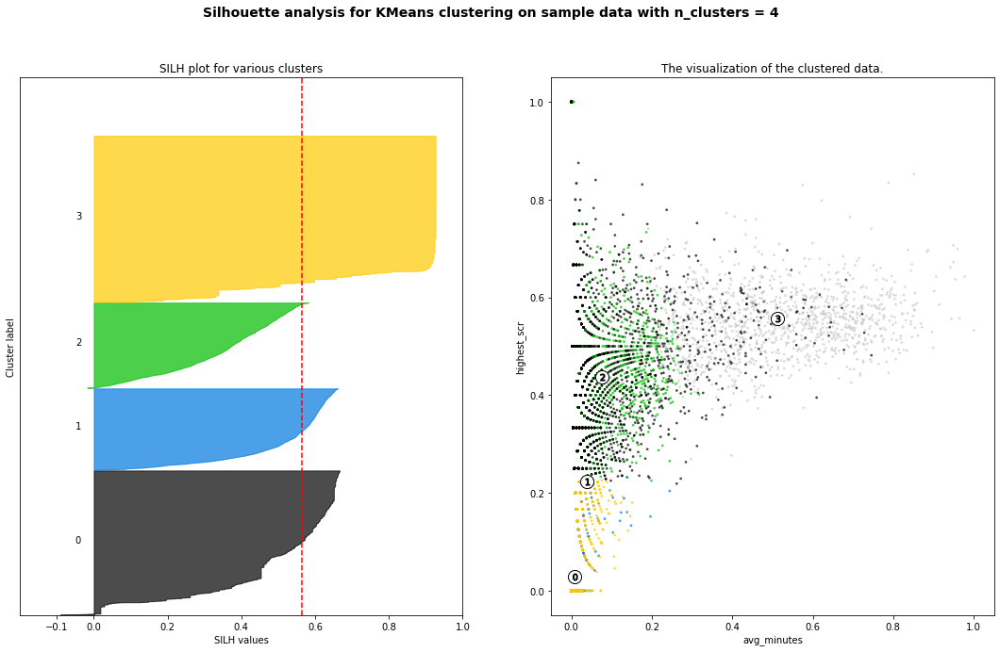

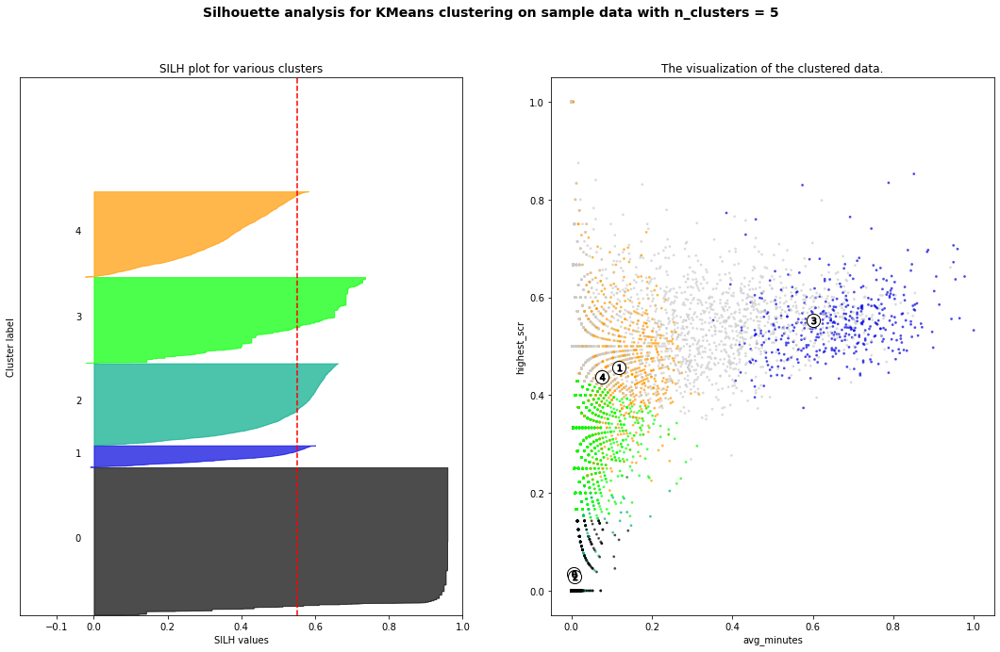

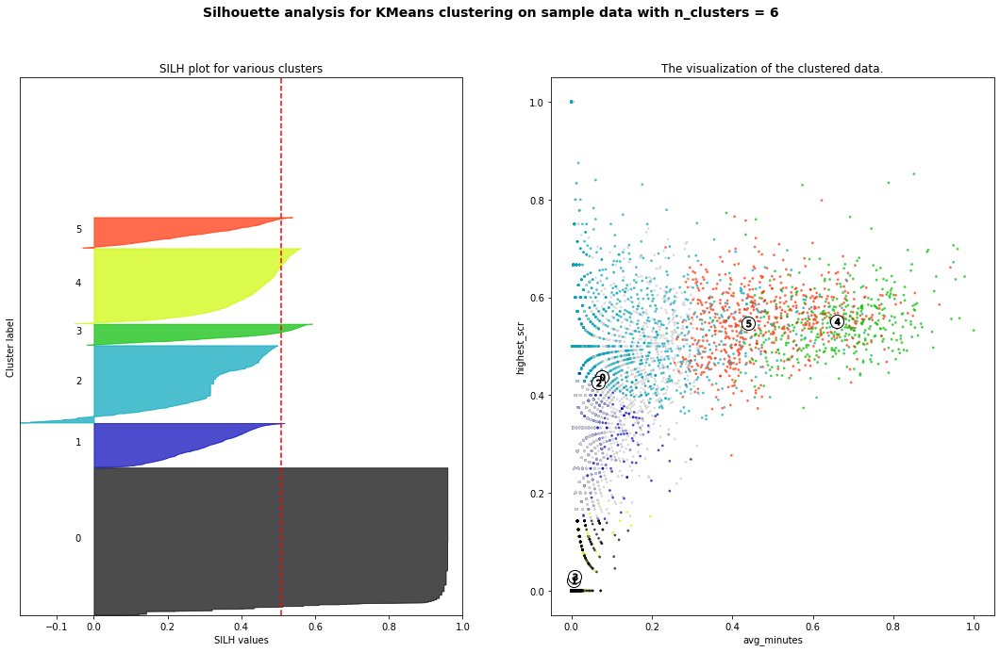

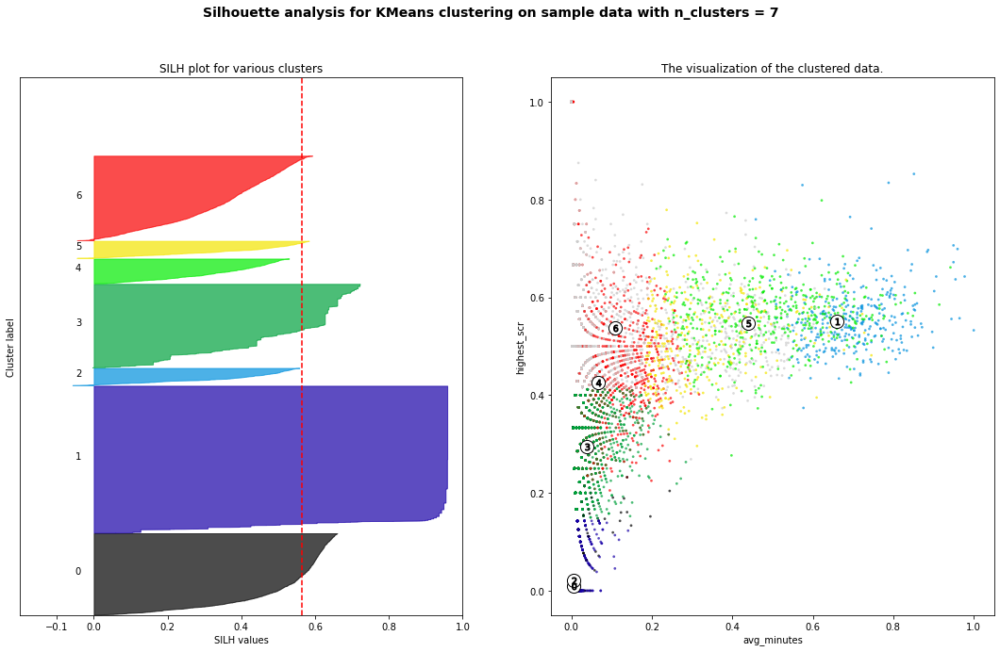

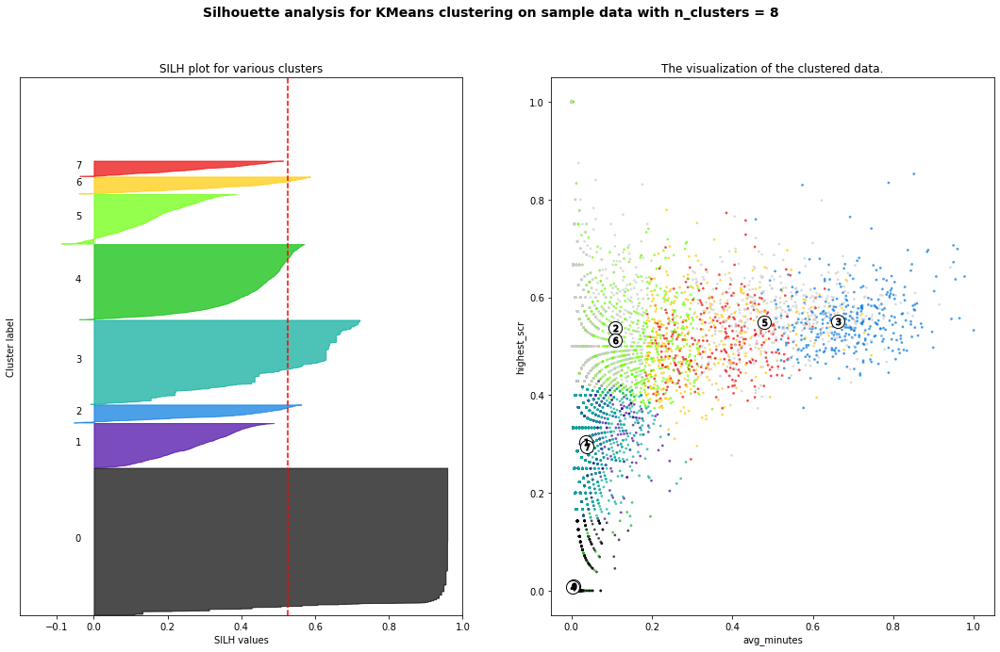

...

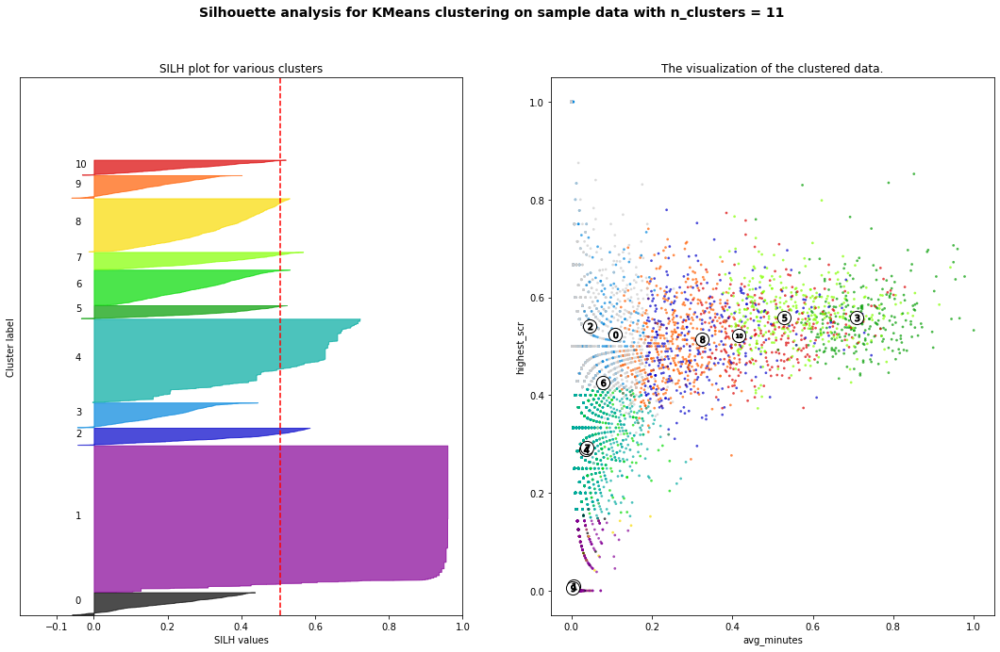

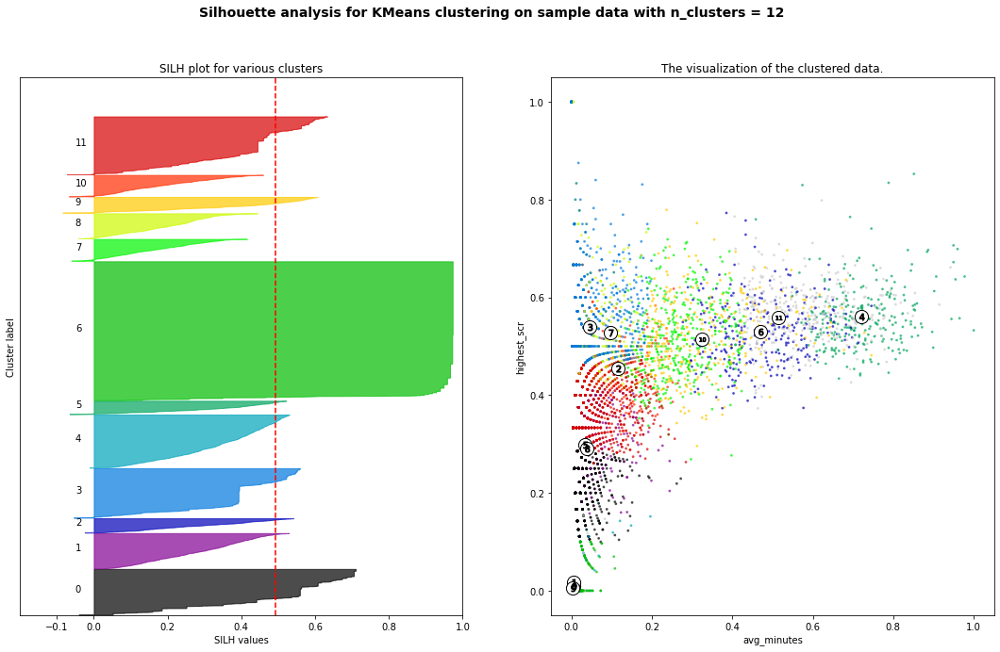

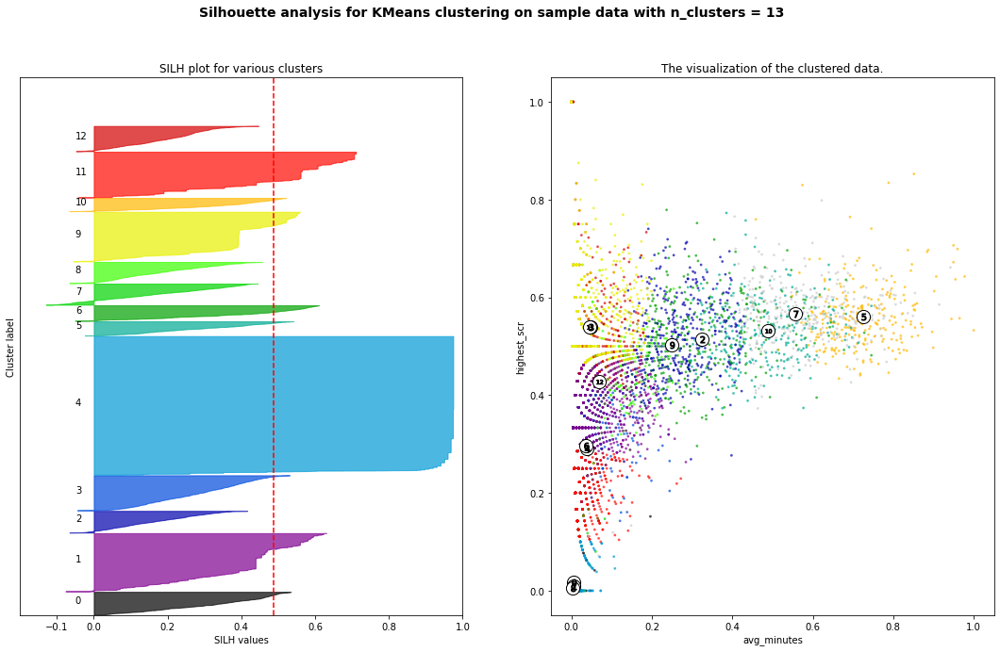

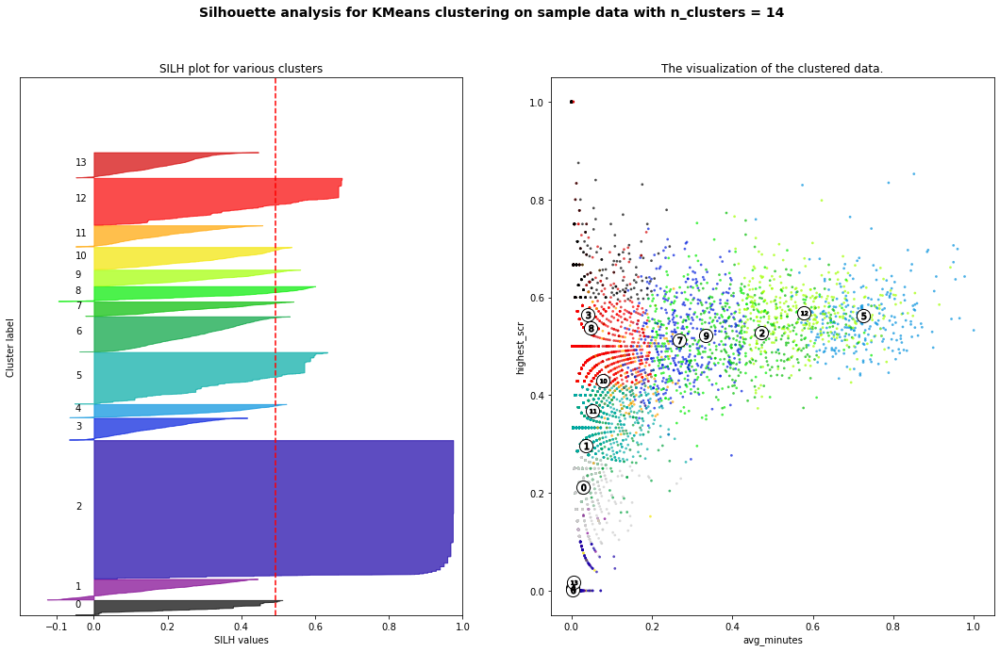

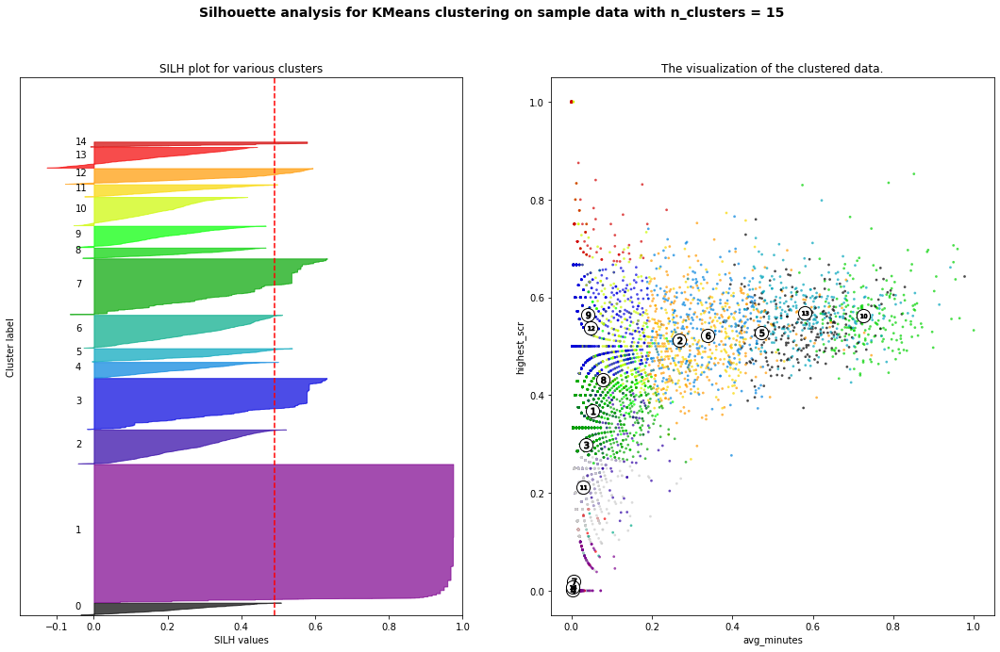

In [36]:
range_n_clusters = list(range(4,16)) 

for n_clusters in range_n_clusters:
    fig, (ax1,ax2) = plt.subplots(1,2)
    fig.set_size_inches(18.5,10.5)
    
    # ax1 refers to the first subplot; it is the silhouette plot.
    # while it's value lives in [-1,+1], to get a prettier plot we'll set 
    # the lower displayed limit to 0.2 (without loss of information)
    ax1.set_xlim([-0.2,1])
    ax1.set_ylim(0,len(X)+(n_clusters+1)*10)
    
    # we extract the labels from the previous kmeans computation
    cluster_labels = kmeanselbow[n_clusters].fit_predict(X)
    
    # we want to analyze the density and the separation of the clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_cluster",
        n_clusters,
        "the avg SILH is",
        silhouette_avg,
    )
    
    # then we compute the silh scores
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    
    y_lower = 10
    #Reachability Distance: it is defined with respect to another point q. Hence the Reachability Distance is equal to the maximum between the core distance of a point and its eucli
    for i in range(n_clusters):
        # for each cluster, we aggregate the silh scores
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels==i]
        
        ith_cluster_silhouette_values.sort()
        
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = size_cluster_i + y_lower
        
        # and we represent the clusters with a nice color
        color = cm.nipy_spectral(float(i)/n_clusters)
        ax1.fill_betweenx(
        np.arange(y_lower,y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7
        )
        
        # we assign the cluster number to the corresponding silh plot
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # and we concatenate each cluster
        y_lower = y_upper + 10  # 10 for the 0 samples
    
    ax1.set_title("SILH plot for various clusters")
    ax1.set_xlabel("SILH values")
    ax1.set_ylabel("Cluster label")

    # this shows the vertical dotted line representing the average silh score
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    # we clear the yaxis labels / ticks
    ax1.set_yticks([])  
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # from here on starts the second subplot, showing an example of the clusters on the first two features
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")
    
    # as before, we label the clusters
    centers = kmeanselbow[n_clusters - 2].cluster_centers_

    # we want to actually show which cluster has its center there; we need a white circle
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    # and we put the number in the circle
    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("avg_minutes")
    ax2.set_ylabel("highest_scr")
    
    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [37]:
# now we can analyze the silhouette score for each of the most interesting clusters (previously obtained with the elbow method)
# this number will be hand picked: we want all the clusters to lie ahead of the red line and an overall low value of silh
selected_k = 6
selected_kmeans = kmeanselbow[4]

In [38]:
# now we can look at the centers for each couple of features
centers = scaler.inverse_transform(selected_kmeans.cluster_centers_)
selected_kmeans.cluster_centers_

array([[7.69617006e-02, 4.37975474e-01, 1.38376023e-06, 4.13162686e-05,
        2.98277012e-04, 1.40328977e-01, 7.26202820e-04],
       [5.63181516e-03, 2.08608060e-02, 5.19418884e-03, 1.06522244e-01,
        6.67604267e-01, 9.70370339e-02, 4.05715219e-04],
       [6.59314396e-02, 4.26006897e-01, 3.78022105e-02, 1.54929784e-01,
        6.77503612e-01, 1.40522863e-01, 4.51714118e-03],
       [7.59044252e-03, 2.96708403e-02, 2.57773415e-06, 2.79342273e-05,
        5.10399006e-04, 1.40193880e-01, 3.01293585e-05],
       [6.59881208e-01, 5.50594938e-01, 5.89800464e-01, 2.18129167e-01,
        6.91936806e-01, 1.85282998e-01, 1.07360501e-01],
       [4.38930666e-01, 5.48116176e-01, 1.29542309e-01, 1.21949827e-01,
        6.92540760e-01, 1.61378358e-01, 2.61907284e-02]])

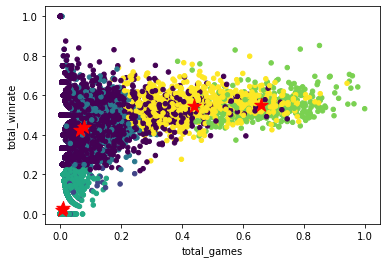

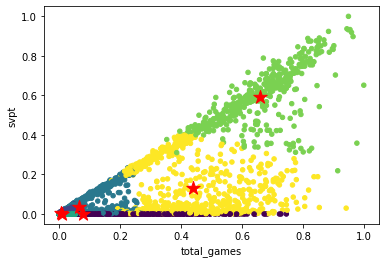

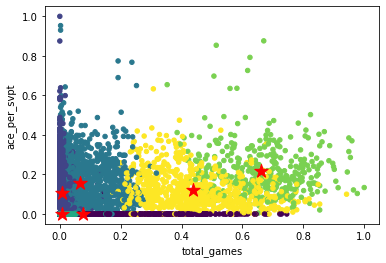

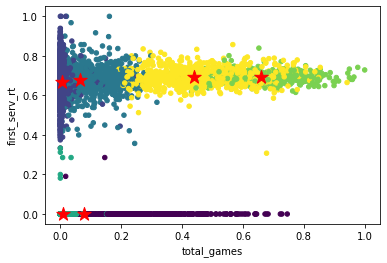

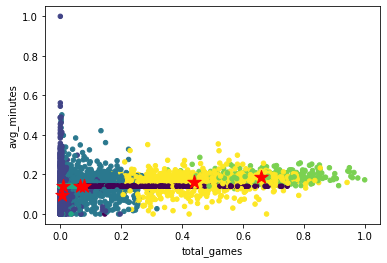

...

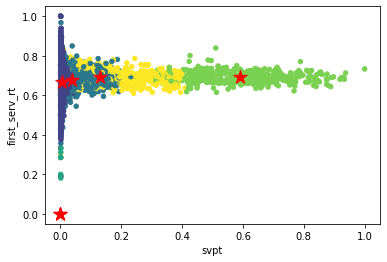

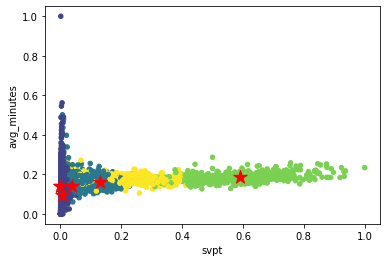

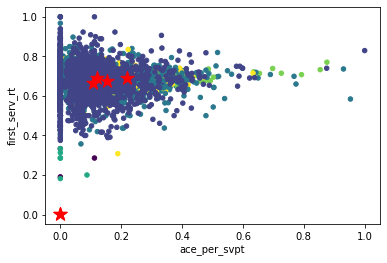

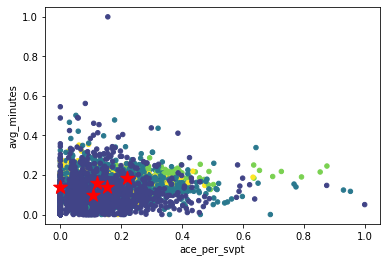

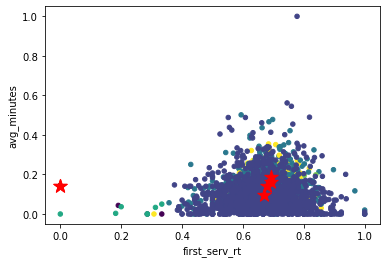

In [39]:
from itertools import combinations

for i in combinations(range(6),2): 
    x, y = i
    
    plt.figure()
        
    plt.scatter(X[:,x], X[:,y], c=selected_kmeans.labels_, s=20)
    plt.xlabel(df_profile_clone.columns[x])
    plt.ylabel(df_profile_clone.columns[y])

    plt.scatter(selected_kmeans.cluster_centers_[:, x], selected_kmeans.cluster_centers_[:, y], s=200, marker='*', c='r')
    
    plt.show()

In [40]:
# and we can print statistics on the chosen k
print('SSE %s' % selected_kmeans.inertia_)
print('Silhouette %s' % metrics.silhouette_score(X, selected_kmeans.labels_))
print('Separation %s' % metrics.davies_bouldin_score(X, selected_kmeans.labels_))

SSE 282.1902271874626
Silhouette 0.5636914678567505
Separation 0.7855348893577107


# OPTICS #

__OPTICS__ (__Ordering points to identify the clustering structure__), is an algorithm for finding density-based clusters in spatial data.

It is very similar to the algorithm __DBSCAN__, but while __DBSCAN__ assumes a constant density for the clusters, __OPTICS__ allows varying density.

The two parameters used in __DBSCAN__, __eps__ and __min_samples=counter__, are also present in __OPTICS__, moreover, __OPTICS__ adds two other parameters, which are called __Core Distance__ and __Reachability Distance__.

__Core Distance__: it is the minimum radius required to classify a point as a __core point__. The __Core Distance__ is undefined if a point is not a __core point__.

__Reachability Distance__: it is defined with respect to another point __q__. Hence the __Reachability Distance__ is equal to the maximum between the __core distance__ of a point and its euclidian distance with __q__. The __Reachability Distance__ is not defined if __q__ is not a __core point__.

Finally, the clusters can be obtained plotting the __reachability-plot__ (a special type of dendrogram), with the sorted points on the x-axis, and the __Reachability Distance__ on the y-axis. The lower is the value on the dendrogram, the higher is the density of the cluster, in that way we can easily identify which are the clusters of our dataframe.

To obtain better results we __OPTICS__ we used the dataframe previously created containing less records. In this dataframe we eliminated all the players which have had many zeros on some attributes about their performance. In this way __OPTICS__ is able to find better clusters for our analysis.

In [41]:
from pyclustering.cluster.optics import optics
from pyclustering.cluster.optics import ordering_analyser
from pyclustering.cluster.optics import ordering_visualizer

Firstly we applied __OPTICS__ using some random values.

In [42]:
radius = 0.1 
neighbors = 5
amount_of_clusters = 3 #Here we told to OPTICS how many clusters we want to find

optics_instance = optics(Y, radius, neighbors, amount_of_clusters) #Specifying the parameters to the algorithm
optics_instance.process() #Executing the algorithm

print(len(Y))

3664


As we can see below, __OPTICS__ was not able to divide properly our points in clusters, it happended because in our dataframe there are no big groups whose players share similar features. Indeed in the dendrograms we can see that there are no areas with low density (except the one in the middle).

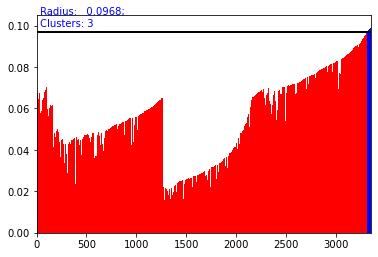

In [43]:
analyser = ordering_analyser(optics_instance.get_ordering()) #This function is used to analyse the results of the algortihm
visualizer = ordering_visualizer.show_ordering_diagram(analyser, amount_of_clusters)

Here we changed the radius in order to try obtaining better results. The higher is the radius, the more are the core points analysed in the dendogram. (the radii were chosen after a deep analysis of the results obtained)

In [44]:
rad_1 = 0.043
rad_2 = 0.060
rad_3 = 0.065
rad_4 = 0.15
rad_5 = 1 #Highest possible radius, every point is a core point

optics_1 = optics(Y, rad_1, neighbors, amount_of_clusters)
optics_2 = optics(Y, rad_2, neighbors, amount_of_clusters)
optics_3 = optics(Y, rad_3, neighbors, amount_of_clusters)
optics_4 = optics(Y, rad_4, neighbors, amount_of_clusters)
optics_5 = optics(Y, rad_5, neighbors, amount_of_clusters)

optics_1.process()
optics_2.process()
optics_3.process()
optics_4.process()
optics_5.process()


Below we plotted the results. As we could have expected when the radius is too big (graphs 4 and 5), the situation is even worse. In these two cases, with a large radius, the algorithm uses too many core points and so it is not able to identify properly the clusters, because in some area the density is too low. On the contrary when the radius is too small (graph 1), the algorithm identifies only about 1000 points out of 3600 as core points. Hence in this case our analysis is completely useless, because we are analysing too few points (hence there are a lot of noise points). However in the graphs 3 and 4 (the radii are 0.06 and 0.065) we can see that the dendrograms are almost acceptable, even though this algorithm was able to identify correctly only 3 clusters (and one of them is very small). We decided that the best value for the radius is 0.065 (graph 3).

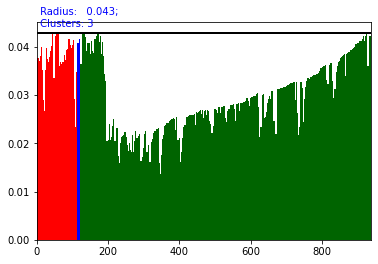

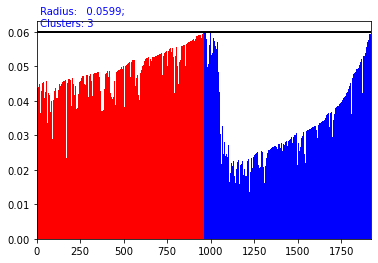

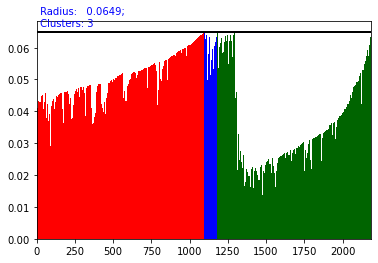

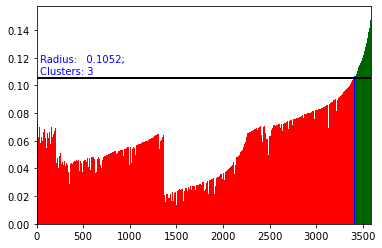

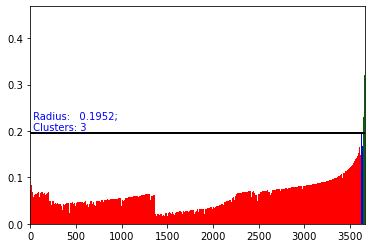

In [45]:
analyser_1 = ordering_analyser(optics_1.get_ordering()) 
visualizer_1 = ordering_visualizer.show_ordering_diagram(analyser_1, amount_of_clusters)

analyser_2 = ordering_analyser(optics_2.get_ordering()) 
visualizer_2 = ordering_visualizer.show_ordering_diagram(analyser_2, amount_of_clusters)

analyser_3 = ordering_analyser(optics_3.get_ordering()) 
visualizer_3 = ordering_visualizer.show_ordering_diagram(analyser_3, amount_of_clusters)

analyser_4 = ordering_analyser(optics_4.get_ordering()) 
visualizer_4 = ordering_visualizer.show_ordering_diagram(analyser_4, amount_of_clusters)

analyser_5 = ordering_analyser(optics_5.get_ordering()) 
visualizer_5 = ordering_visualizer.show_ordering_diagram(analyser_5, amount_of_clusters)

The best result was obtained with a radius equal to 0.065 so we chose that value. To improve our dendrograms by including more core points, we tried decreasing the number of neighbours required to be a core points. However the results didn't improve. Hence, we found the best results with a radius of __0.085__ and a number of neighbours of __5__.

In [46]:
radius = 0.065

neigh_1 = 2
neigh_2 = 3

optics_1 = optics(Y, radius, neigh_1, amount_of_clusters)
optics_2 = optics(Y, radius, neigh_2, amount_of_clusters)

optics_1.process()
optics_2.process()

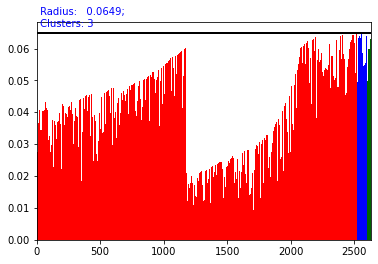

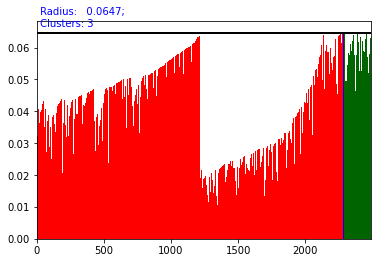

In [47]:
analyser_1 = ordering_analyser(optics_1.get_ordering()) 
visualizer_1 = ordering_visualizer.show_ordering_diagram(analyser_1, amount_of_clusters)

analyser_2 = ordering_analyser(optics_2.get_ordering()) 
visualizer_2 = ordering_visualizer.show_ordering_diagram(analyser_2, amount_of_clusters)

# Clusters' interpretation #

We want to give an interpretation to the clusters created. In particolar, we want to analyse the clusters created by the two algorithms that, according to our analyses, performed better; namely, __hierarchical clustering__ with methods __ward__ and __complete__.

## The Ward method ##

Firstly we studied the clusters returned by the __ward__ method. Below we computed the indices of the records of every cluster.

In [48]:
indices_1 = np.where(clusterWard.labels_ == 0)[0]
indices_2 = np.where(clusterWard.labels_ == 1)[0]
indices_3 = np.where(clusterWard.labels_ == 2)[0]
indices_4 = np.where(clusterWard.labels_ == 3)[0]
indices_5 = np.where(clusterWard.labels_ == 4)[0]
indices_6 = np.where(clusterWard.labels_ == 5)[0]

Here we printed the values of some random players belonging to these clusters.

In [49]:
ind_player_1 = indices_1[int(len(indices_1)/2)]
ind_player_2 = indices_2[int(len(indices_2)/2)]
ind_player_3 = indices_3[int(len(indices_3)/2)]
ind_player_4 = indices_4[int(len(indices_4)/2)]
ind_player_5 = indices_5[int(len(indices_5)/2)]
ind_player_6 = indices_6[int(len(indices_6)/2)]

Below we can see the profile of a player belonging to the first cluster. She is __Aunchisa Chanta__, as we can see, she has usually played in __ITF__ tournaments with a money prize of __15.000$__ (level 15). She has no data about the number of aces perfomed, or the average number of breakpoints saved or faced. Probably this is the reason why she has been assigned to this cluster (indeed there are a lot of players having no data in these fields, hence they may have been assigned to the same cluster). Finally, we can notice also that se has not played many mantches and her highest score is pretty low (only 46 points, the mean is 120 points).

In [50]:
print(df_player_profile.loc[ind_player_1])

player_id                220598.0
player_name       Aunchisa Chanta
player_ht                     NaN
player_hand                     U
total_wins                     22
total_losses                   22
total_games                    44
16/17_wins                      0
17/18_wins                      0
18/19_wins                     14
19/20_wins                      8
20/21_wins                      0
21/22_wins                      0
16/17_losses                    0
17/18_losses                    3
18/19_losses                    8
19/20_losses                   11
20/21_losses                    0
21/22_losses                    0
16/17_games                     0
17/18_games                     3
18/19_games                    22
19/20_games                    19
20/21_games                     0
21/22_games                     0
total_winrate                 0.5
16/17_winrate                 0.0
17/18_winrate                 0.0
18/19_winrate            0.636364
19/20_winrate 

__Laura Margareta Luca__ is the player of the second cluster. She has played only match and almost every stat is blank (even the __highest_score__ is empty). So probably this is the cluster of the players that have played only one or two matches. 

In [51]:
print(df_player_profile.loc[ind_player_2])

player_id                     215027.0
player_name       Laura Margareta Luca
player_ht                          NaN
player_hand                          U
total_wins                           0
total_losses                         1
total_games                          1
16/17_wins                           0
17/18_wins                           0
18/19_wins                           0
19/20_wins                           0
20/21_wins                           0
21/22_wins                           0
16/17_losses                         0
17/18_losses                         1
18/19_losses                         0
19/20_losses                         0
20/21_losses                         0
21/22_losses                         0
16/17_games                          0
17/18_games                          1
18/19_games                          0
19/20_games                          0
20/21_games                          0
21/22_games                          0
total_winrate            

This is the player of the third cluster. We can notice that she is similar to the player of the first cluster, indeed the __highest_score__ is very low (only 5 points) and she has played in the __ITF__ tournament. However this player has no stat blank, so probably this the different between this player and the player of the first cluster.

In [52]:
print(df_player_profile.loc[ind_player_3])

player_id               206426.0
player_name       Giulia Pairone
player_ht                    NaN
player_hand                    R
total_wins                     6
total_losses                   8
total_games                   14
16/17_wins                     4
17/18_wins                     1
18/19_wins                     1
19/20_wins                     0
20/21_wins                     0
21/22_wins                     0
16/17_losses                   3
17/18_losses                   4
18/19_losses                   1
19/20_losses                   0
20/21_losses                   0
21/22_losses                   0
16/17_games                    7
17/18_games                    5
18/19_games                    2
19/20_games                    0
20/21_games                    0
21/22_games                    0
total_winrate           0.428571
16/17_winrate           0.571429
17/18_winrate                0.2
18/19_winrate                0.5
19/20_winrate                0.0
20/21_winr

The player of the fourth cluster has played in the __Challengers__ tournament (a good tournament), he has played many matches and the highest rank is very high (369 points, the average is 120 points). Since he has played many matches, his stats are pretty high, so probably good players belong in this cluster.

In [53]:
print(df_player_profile.loc[ind_player_4])

player_id                  111453.0
player_name       Mikael Torpegaard
player_ht                       NaN
player_hand                       R
total_wins                       87
total_losses                     69
total_games                     156
16/17_wins                        8
17/18_wins                        5
18/19_wins                       20
19/20_wins                       34
20/21_wins                       13
21/22_wins                        7
16/17_losses                      4
17/18_losses                      6
18/19_losses                     11
19/20_losses                     23
20/21_losses                     10
21/22_losses                     15
16/17_games                      12
17/18_games                      11
18/19_games                      31
19/20_games                      57
20/21_games                      23
21/22_games                      22
total_winrate              0.557692
16/17_winrate              0.666667
17/18_winrate              0

__Vitalii Shcherba__ is the player of the fifth cluster, she played few matches, but her stats (like __ace__ or __svpt__) are not empty. She has played in the __ATP__ tournament, but the __highest_score__ is low (5 points). This should be another cluster of players that have played few matches.

In [54]:
print(df_player_profile.loc[ind_player_5])

player_id                 125793.0
player_name       Vitalii Shcherba
player_ht                      NaN
player_hand                      U
total_wins                       0
total_losses                     3
total_games                      3
16/17_wins                       0
17/18_wins                       0
18/19_wins                       0
19/20_wins                       0
20/21_wins                       0
21/22_wins                       0
16/17_losses                     0
17/18_losses                     2
18/19_losses                     1
19/20_losses                     0
20/21_losses                     0
21/22_losses                     0
16/17_games                      0
17/18_games                      2
18/19_games                      1
19/20_games                      0
20/21_games                      0
21/22_games                      0
total_winrate                  0.0
16/17_winrate                  0.0
17/18_winrate                  0.0
18/19_winrate       

__Andreas Seppi__ is the player of the sixth cluster. He has played many matches and his score is very high (1360 points). This one must be the cluster of the best players in the dataframe.

In [55]:
print(df_player_profile.loc[ind_player_6])

player_id              104312.0
player_name       Andreas Seppi
player_ht                 190.0
player_hand                   R
total_wins                  140
total_losses                141
total_games                 281
16/17_wins                   22
17/18_wins                   27
18/19_wins                   34
19/20_wins                   29
20/21_wins                   10
21/22_wins                   18
16/17_losses                 26
17/18_losses                 28
18/19_losses                 28
19/20_losses                 26
20/21_losses                 16
21/22_losses                 17
16/17_games                  48
17/18_games                  55
18/19_games                  62
19/20_games                  55
20/21_games                  26
21/22_games                  35
total_winrate          0.498221
16/17_winrate          0.458333
17/18_winrate          0.490909
18/19_winrate          0.548387
19/20_winrate          0.527273
20/21_winrate          0.384615
21/22_wi

Below we computed the average stat of the players of every cluster, we used the attributes __total_games__, __total_winrate__, __fvrt_level__, __perc_bs__, __first_serv_rt__ and __avg_scr__.

In [56]:
df_avg_player = pd.DataFrame( columns=['total_games', 'total_winrate', 'perc_bs', 'first_serv_rt', 'fvrt_level', 'avg_scr'])
indices_list = [indices_1, indices_2, indices_3, indices_4, indices_5, indices_6]

for cluster_list in indices_list:
    total_games = 0 #variable to count the total number of matches played
    tg_occ = 0 #counting all the records of cluster 1 that have a value different from nan on the attribute total_games

    total_winrate = 0
    tw_occ = 0
    f_level = {
        '15': 0,
        'C': 0,
        '25': 0,
        'A': 0,
        '10': 0,
        'G': 0,
        'I': 0,
        '60': 0,
        'P': 0,
        'M': 0,
        '100': 0,
        'D': 0,
        '80': 0,
        '50': 0,
        'PM': 0,
        'W': 0,
        'F': 0,
        '75': 0,
        'O': 0
    }

    perc_bs = 0
    pbs_occ = 0

    first_serv_rt = 0
    fsr_occ = 0

    avg_scr = 0
    as_occ = 0

    for i in cluster_list:
        if not math.isnan(df_player_profile['total_games'].iloc[i]):
            total_games = total_games + df_player_profile['total_games'].iloc[i]
            tg_occ = tg_occ + 1
        if not math.isnan(df_player_profile['total_winrate'].iloc[i]):
            total_winrate = total_winrate + df_player_profile['total_winrate'].iloc[i]
            tw_occ = tw_occ + 1
        if df_player_profile['fvrt_level'].iloc[i] == df_player_profile['fvrt_level'].iloc[i]:
            lvl = df_player_profile['fvrt_level'].iloc[i]
            f_level[lvl] = f_level[lvl] + 1
        if not math.isnan(df_player_profile['perc_bs'].iloc[i]):
            perc_bs = perc_bs + df_player_profile['perc_bs'].iloc[i]
            pbs_occ = pbs_occ + 1
        if not math.isnan(df_player_profile['first_serv_rt'].iloc[i]):
            first_serv_rt = first_serv_rt + df_player_profile['first_serv_rt'].iloc[i]
            fsr_occ = fsr_occ + 1
        if not math.isnan(df_player_profile['avg_scr'].iloc[i]):
            avg_scr = avg_scr + df_player_profile['avg_scr'].iloc[i]
            as_occ = as_occ + 1

    total_games = total_games / tg_occ
    total_winrate = total_winrate / tw_occ
    perc_bs = perc_bs / pbs_occ
    first_serv_rt = first_serv_rt / fsr_occ
    avg_scr = avg_scr / as_occ

    maximum_l = 0
    level = np.nan
    for h in f_level:
        if f_level[h] > maximum_l:
            maximum_l = f_level[h]
            level = h
    avg_player = [ total_games, total_winrate, perc_bs, first_serv_rt, level, avg_scr]
    df_length = len(df_avg_player)
    df_avg_player.loc[df_length]  = avg_player
print(df_avg_player)

   total_games  total_winrate   perc_bs  first_serv_rt fvrt_level      avg_scr
0    33.414091       0.459758  0.000220       0.000343         15     7.956036
1     5.068248       0.048660  0.000000       0.000000         15     0.552010
2    31.513752       0.407401  0.341447       0.678853          C    56.042606
3   197.667166       0.551225  0.344081       0.693830         25   304.353515
4     2.102659       0.001364  0.293726       0.663641          C     3.850419
5   278.768421       0.554474  0.374233       0.690640          C  1033.118704


Below we reported the results.

__cluster 1__: As we can notice, the players of the first cluster have played about thirty matches in __ITF__ tournaments, they have no stats like __perc_bs__ or __first_serv_rt__ (probably they have not been reported, because the tournaments in __ITF__ are not very important). The average score of these players is very low.

__cluster 2__: The players of this cluster have played only few matches. They have played mostly in __ITF__ and they have no stats like __perc_bs__ or __first_serv_rt__ (probably the reason is the same of the previous cluster). the average number of points is pretty close to zero.

__cluster 3__: This is the cluster whose players played in the __Challengers__ (so their level is higher with respect to the players of the previous two clusters). They have no stat empty, and they have played about thirty matches in average. The players of this cluster have score about 56 points (the average is 120 points, so they are excellent players)

__cluster 4__: In this cluster belong good players. Their average score is high (304 points), they have played about 200 matches in average and they won 55% of times. Also the other stats are pretty good.

__cluster 5__: This is the cluster of players that gave played only few matches. The main difference between them and the second cluster's players is that the former have not any blank stat. But their average score is very low, only 3 points. (the __winrate__ is also close to zero).

__cluster 6__: This is the cluster of the best tennis players, their average score is very high (more than 1000 points) and they have played in the __Challengers__. They have played many matches (278 matches) and they have won 55% of times.

Below we printed how many records belong to these clusters.


In [57]:
print("records of the first cluster: " + str(len(indices_1)))
print("records of the second cluster: " + str(len(indices_2)))
print("records of the third cluster: " + str(len(indices_3)))
print("records of the fourth cluster: " + str(len(indices_4)))  
print("records of the fifth cluster: " + str(len(indices_5)))  
print("records of the sixth cluster: " + str(len(indices_6)))  

records of the first cluster: 2427
records of the second cluster: 3414
records of the third cluster: 1927
records of the fourth cluster: 667
records of the fifth cluster: 1354
records of the sixth cluster: 285



## The Complete method ##

below, we computed the representative player for each cluster of the __Complete__ method.

In [58]:
indices_1 = np.where(clusterMax.labels_ == 0)[0] # Computing the indices of the records of every cluster
indices_2 = np.where(clusterMax.labels_ == 1)[0]
indices_3 = np.where(clusterMax.labels_ == 2)[0]

In [59]:
df_avg_player = pd.DataFrame( columns=['total_games', 'total_winrate', 'perc_bs', 'first_serv_rt', 'fvrt_level', 'avg_scr'])
indices_list = [indices_1, indices_2, indices_3]

for cluster_list in indices_list:
    total_games = 0 #variable to count the total number of matches played
    tg_occ = 0 #counting all the records of cluster 1 that have a value different from nan on the attribute total_games

    total_winrate = 0
    tw_occ = 0
    f_level = {
        '15': 0,
        'C': 0,
        '25': 0,
        'A': 0,
        '10': 0,
        'G': 0,
        'I': 0,
        '60': 0,
        'P': 0,
        'M': 0,
        '100': 0,
        'D': 0,
        '80': 0,
        '50': 0,
        'PM': 0,
        'W': 0,
        'F': 0,
        '75': 0,
        'O': 0
    }

    perc_bs = 0
    pbs_occ = 0

    first_serv_rt = 0
    fsr_occ = 0

    avg_scr = 0
    as_occ = 0

    for i in cluster_list:
        if not math.isnan(df_player_profile['total_games'].iloc[i]):
            total_games = total_games + df_player_profile['total_games'].iloc[i]
            tg_occ = tg_occ + 1
        if not math.isnan(df_player_profile['total_winrate'].iloc[i]):
            total_winrate = total_winrate + df_player_profile['total_winrate'].iloc[i]
            tw_occ = tw_occ + 1
        if df_player_profile['fvrt_level'].iloc[i] == df_player_profile['fvrt_level'].iloc[i]:
            lvl = df_player_profile['fvrt_level'].iloc[i]
            f_level[lvl] = f_level[lvl] + 1
        if not math.isnan(df_player_profile['perc_bs'].iloc[i]):
            perc_bs = perc_bs + df_player_profile['perc_bs'].iloc[i]
            pbs_occ = pbs_occ + 1
        if not math.isnan(df_player_profile['first_serv_rt'].iloc[i]):
            first_serv_rt = first_serv_rt + df_player_profile['first_serv_rt'].iloc[i]
            fsr_occ = fsr_occ + 1
        if not math.isnan(df_player_profile['avg_scr'].iloc[i]):
            avg_scr = avg_scr + df_player_profile['avg_scr'].iloc[i]
            as_occ = as_occ + 1

    total_games = total_games / tg_occ
    total_winrate = total_winrate / tw_occ
    perc_bs = perc_bs / pbs_occ
    first_serv_rt = first_serv_rt / fsr_occ
    avg_scr = avg_scr / as_occ

    maximum_l = 0
    level = np.nan
    for h in f_level:
        if f_level[h] > maximum_l:
            maximum_l = f_level[h]
            level = h
    avg_player = [ total_games, total_winrate, perc_bs, first_serv_rt, level, avg_scr]
    df_length = len(df_avg_player)
    df_avg_player.loc[df_length]  = avg_player
print(df_avg_player)

   total_games  total_winrate   perc_bs  first_serv_rt fvrt_level      avg_scr
0    40.475601       0.293884  0.093421       0.185349         15    52.071416
1   303.467742       0.585639  0.379361       0.690256          C  1584.348310
2     6.207865       0.088467  0.305776       0.664079          C     9.821302


Below we reported the results.

This time we have only three clusters.

__cluster 1__: The players of this cluster have played in average 40 matches (so an average number of matches). Moreover, we can notice that the __total_winrate__ of this cluster is typically low, indeed the players of this cluster have won only 29% of times. The percentage of breakpoints saved is very low, probably because many of these players do not have any value on this attribute (same thing for __first_serv_rt__). The players of this clusters have played the most in the __ITF__ level, and their average score is pretty low.

__cluster 2__: In this cluster there are the best players of the dataframe. The have played the most in the __Challengers__, the __total_winrate__ is high and they have also good values on the attributes __perc_best__ and __first_serv_rt__. Their average score is very high.

__cluster 3__: In this cluster probably there are the worst players in the dataset. The average score is very low (about 10 points) and also their winrate is low.

Below we printed how many records belong to these clusters.

In [60]:
print("records of the first cluster: " + str(len(indices_1))) #The majority of the players are in the first cluster (about 80%)
print("records of the second cluster: " + str(len(indices_2))) #Few players in the cluster of the best players
print("records of the third cluster: " + str(len(indices_3)))  

records of the first cluster: 7992
records of the second cluster: 124
records of the third cluster: 1958
